In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from functions.crop import *
from functions.cart import *
from functions.utils import *
from functions.analyse import *

In [9]:
# # from doc_ufcn import models
# # from doc_ufcn.main import DocUFCN
# # page detection
# model_path, parameters = models.download_model('generic-page', version="main")
# model = DocUFCN(len(parameters['classes']), parameters['input_size'],'cpu')
# model.load(model_path, parameters['mean'], parameters['std'])
# polygons = model.predict(image)
# detected = polygons[0][1][0]['polygon']
# ys = [j for j,i in detected]
# xs = [i for j,i in detected]
# y, y_ = (min(ys), max(ys))
# x, x_ = (min(xs), max(xs))

# # text line detection
# model_path_, parameters_ = models.download_model('generic-historical-line', version="main")
# model_ = DocUFCN(len(parameters_['classes']), parameters_['input_size'],'cpu')
# model_.load(model_path_, parameters_['mean'], parameters_['std'])
# polygons_ = model_.predict(image)

# # show results
# fig, ax = plt.subplots(1, 1,figsize=(5,7))
# ax.imshow(image)
# for i,j in polygons[0][1][0]['polygon']:
#     ax.scatter(i,j,s=0.1,color='tomato')
# for i,j in polygons_[0][1][0]['polygon']:
#     ax.scatter(i,j,s=0.1,color='teal')
# plt.show()


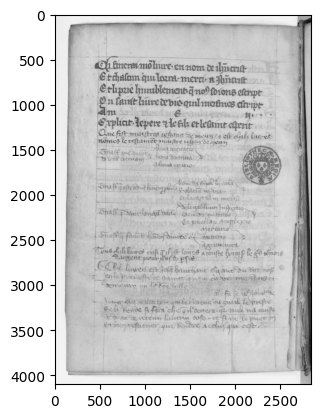

In [3]:
# impath = "E://robocodico/ImagesCodicologie/Corpus de jeu/Emilie/reframed/BnF Fr 5586, f. 23v-24_00.png"
# impath = "E://robocodico/ImagesCodicologie/Corpus de jeu/Lebec/reframed/Boethius_De_institutione_arithmetica-f7v_0.png"
# impath = "E://robocodico/ImagesCodicologie/Corpus de jeu/Emilie/BnF Lat 1865, f. 22v.jpeg"
# impath = "E://robocodico/ImagesCodicologie/Corpus de jeu/Julien/Lat 12883_45r.jpg"
impath = "E://robocodico/ImagesCodicologie/Corpus de jeu/Julien/Corpus B/Fr_2063_163v.jpg"
image = cv2.imread(impath)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

norm_image = gray/255.0
plt.imshow(gray, cmap='gray')
plt.show()

In [80]:
# reframe(image, trim_required=True, save_path=impath)

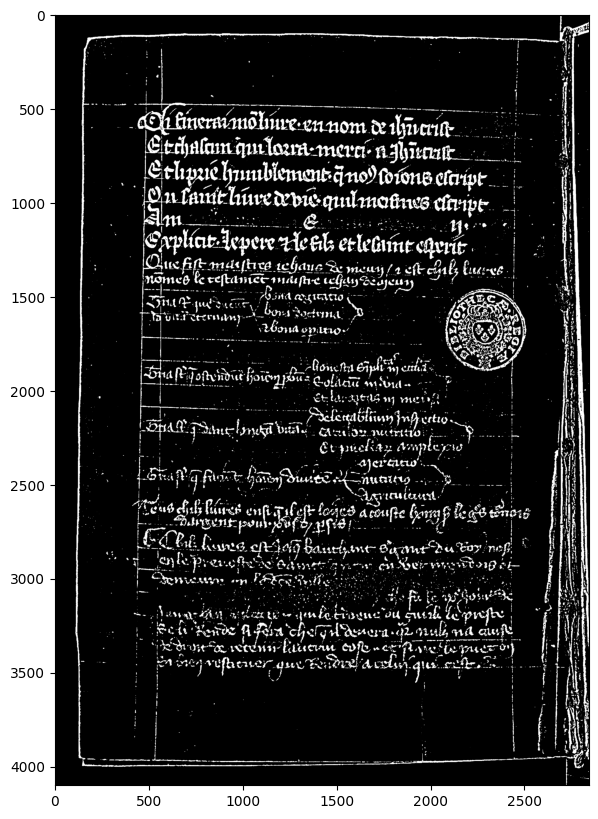

scale= 4
eps_x= 9 eps_y= 2
contains 74546 white pixels
305 clusters found with DBSCAN algorithm


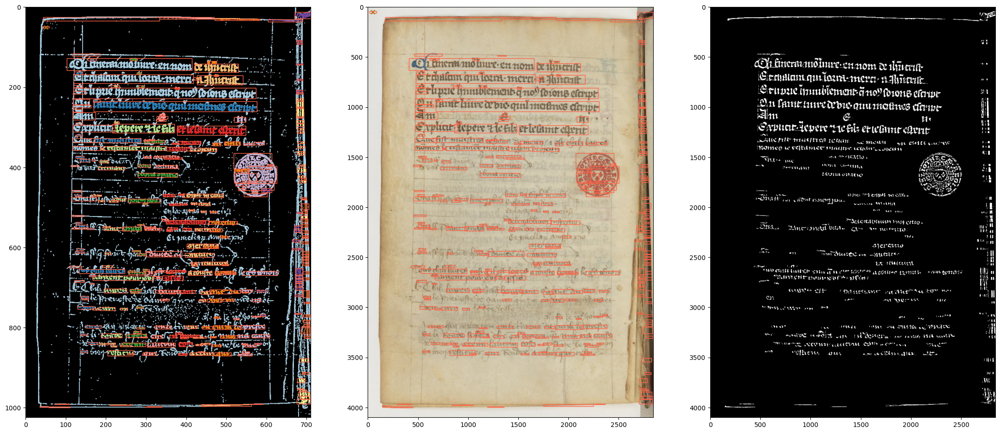

In [11]:
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.07)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
clusters, masks, general_mask = get_connected_components_dbscan(bw, eps_y=2, colored=image)

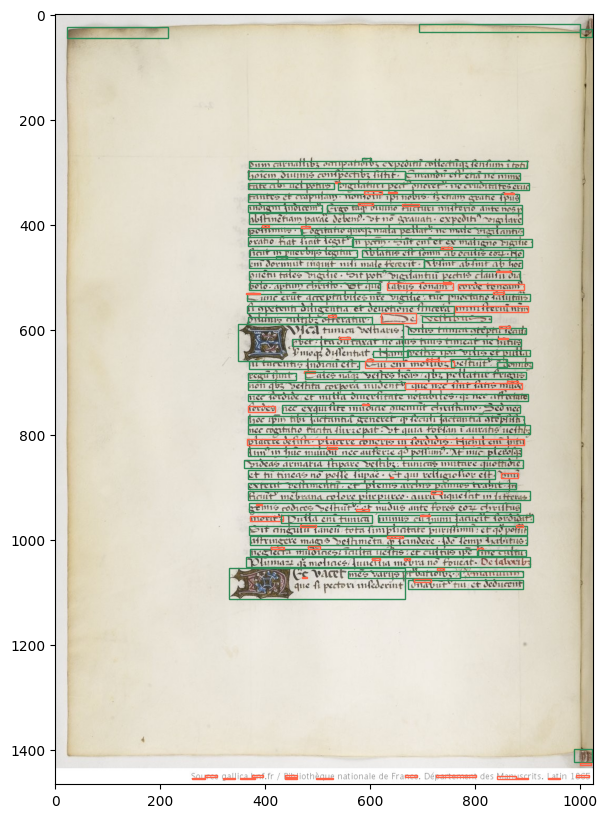

In [9]:
text, non_text = filter_text(image, clusters, masks=masks)

True


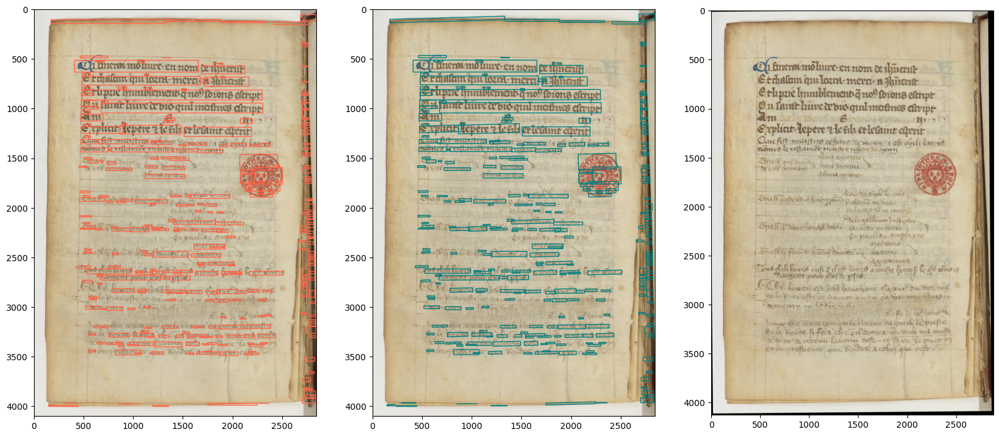

In [13]:
fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(20,10))
ax0.imshow(image)
ax1.imshow(image)
angles = []
for i in range(len(clusters)):
    # print(i, clusters[i], end='')
    x,y,x_,y_ = clusters[i]
    rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False)
    ax0.add_patch(rect)
    # rect = patches.Rectangle((x,y),x_-x,y_-y)
    # find line
    line = cv2.HoughLines(np.uint8(masks[i]), 1, np.pi/180,int(masks[i].shape[1]/2.5))
    # print(len(line))
    if line is not None:
        line = line.squeeze(axis=1)
        # rho = line[0,0] # np.mean(line[:,0])
        # theta = line[0,1] # np.mean(line[:,1])
        # rho = np.mean(line[:,0])
        theta = np.mean(line[:,1])
        angles.append(theta)
        # a = np.cos(-theta-np.pi/2)
        # b = np.sin(-theta-np.pi/2)
        
        # y0 = y # int((rho-x0*np.cos(theta))/np.sin(theta))
        # x0 = int((rho-y0*np.sin(theta))/np.cos(theta)) # x
        # # x0 = max(x0,x)
        # # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))

        # y1 = y_ # int((rho-x1*np.cos(theta))/np.sin(theta))
        # x1 = int((rho-y1*np.sin(theta))/np.cos(theta)) # x_
        # # x1 = min(x1,x_)
        # # y1 = int((rho-x1*np.cos(theta))/np.sin(theta))

        # x0 = int((x_-x)/2)
        # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
        # ax1.axline((x0,y0),slope=-b/a,color='turquoise')
        # rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False)
        # ax1.add_patch(rect)
        # rad = -theta-np.pi/2
        rad = np.pi/2 - theta if theta > np.pi/2 else -theta
        rect = patches.Rectangle((x,y),x_-x,y_-y, angle=rad,color='teal',fill=False)
        ax1.add_patch(rect)
        # rect = patches.Rectangle((x,y),x_-x,y_-y, angle=np.pi - theta,color='teal',fill=False)
        # ax1.add_patch(rect)
        
        # print(x,x0,y,y0,x_,x1,y_,y1)
        # ax1.plot([x0,x1],[y0,y1],color='turquoise',linewidth=3)

        # print('Yeah')
    # else:
        # print('None')
# print(np.pi/2 - np.array(angles))
print(np.median(angles) > np.pi/2)
image_ = rectify(image, rad=np.pi/2 - np.median(angles))
ax2.imshow(image_)
plt.show()

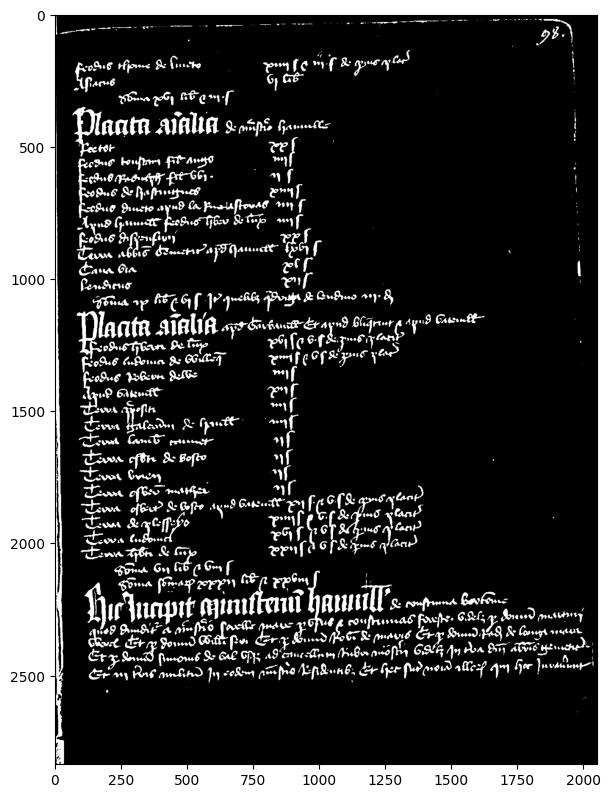

scale= 2
1027
13 2
contains 132541 white pixels
216 clusters found with DBSCAN algorithm
---> 2836 2053
- cluster 1 covers 665 pixel.
- cluster 2 covers 322 pixel.
- cluster 3 covers 47 pixel.
- cluster 4 covers 118 pixel.
- cluster 5 covers 83 pixel.
- cluster 6 covers 162 pixel.
- cluster 7 covers 46 pixel.
- cluster 8 covers 76 pixel.
- cluster 9 covers 731 pixel.
- cluster 10 covers 3006 pixel.
- cluster 11 covers 654 pixel.
- cluster 12 covers 99 pixel.
- cluster 13 covers 103 pixel.
- cluster 14 covers 271 pixel.
- cluster 15 covers 53 pixel.
- cluster 16 covers 172 pixel.
- cluster 17 covers 4839 pixel.
- cluster 18 covers 573 pixel.
- cluster 19 covers 1214 pixel.
- cluster 20 covers 178 pixel.
- cluster 21 covers 141 pixel.
- cluster 22 covers 9371 pixel.
- cluster 23 covers 116 pixel.
- cluster 24 covers 2017 pixel.
- cluster 25 covers 45 pixel.
- cluster 26 covers 496 pixel.
- cluster 27 covers 1764 pixel.
- cluster 28 covers 2121 pixel.
- cluster 29 covers 75 pixel.
- clust

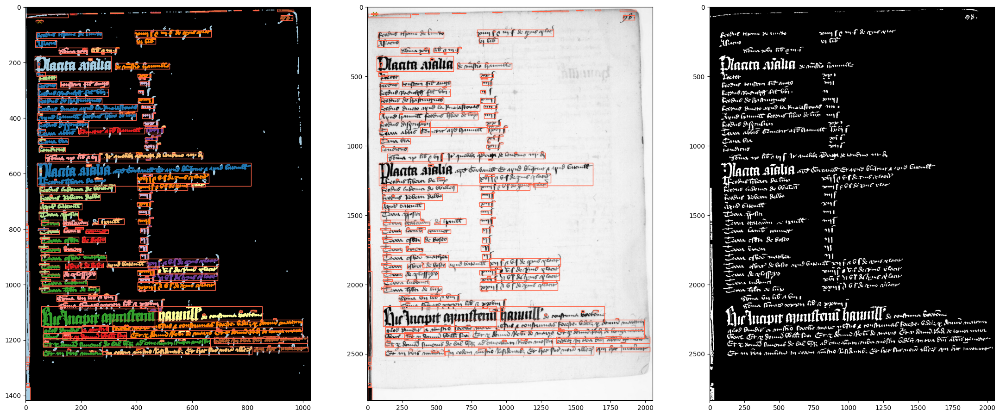

In [17]:
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
clusters, masks, general_mask = get_connected_components_dbscan(bw, eps_y=2, colored=image)

DEPTH = 20
chrono []
done [[0, 0, 1024, 1251, None, None]]
yet [None]


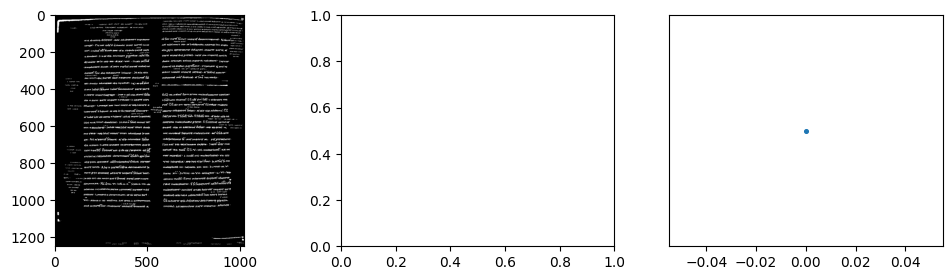

> [None]
---> [(157, 'x', 96852.82184740565, 925.6714009649586)]
yet (157, 'x', 96852.82184740565, 925.6714009649586)
---> new split at 157
DEPTH = 19
chrono [[None, 0.09777849324837061, None, None]]
done [[0, 0, 157, 1251, None, None], [157, 0, 1024, 1251, None, None]]
yet [None, None]


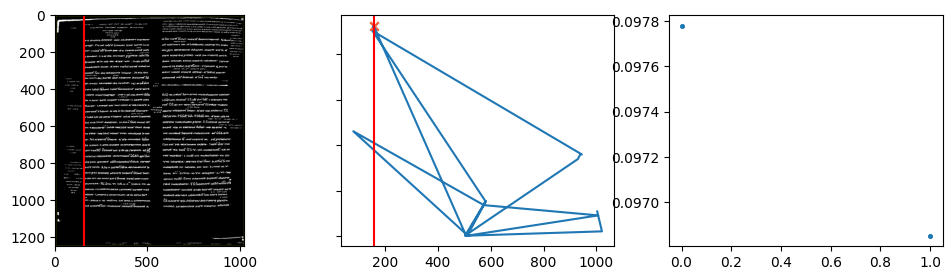

> [None, None]
---> [(155, 'x', 3865.0247879115745, 1.6963880138878267), (939, 'x', 92454.43055560715, 531.670115873043)]
yet (939, 'x', 92454.43055560715, 531.670115873043)
---> new split at 939
DEPTH = 18
chrono [[0, 0.09777849324837061, 157, 'x'], [None, 0.09685282184740565, None, None]]
done [[0, 0, 157, 1251, 3866.7211759254624, None], [157, 0, 939, 1251, None, None], [939, 0, 1024, 1251, None, None]]
yet [(155, 'x', 3865.0247879115745, 1.6963880138878267), None, None]


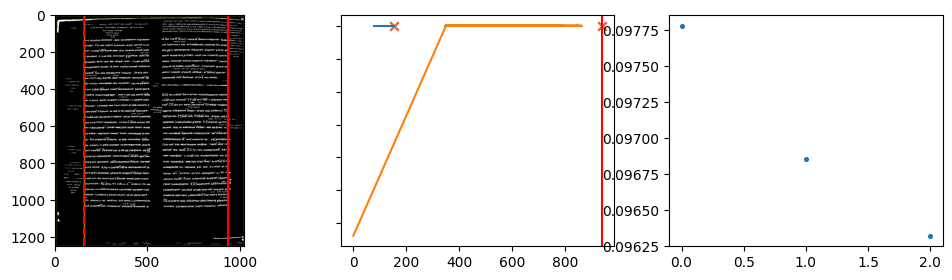

> [(155, 'x', 3865.0247879115745, 1.6963880138878267), None, None]
---> [(155, 'x', 3865.0247879115745, 1.6963880138878267), (582, 'x', 89522.40496597742, 83.70496142645425), (945, 'x', 2841.5552654922044, 6.765362711079433)]
yet (582, 'x', 89522.40496597742, 83.70496142645425)
---> new split at 582
DEPTH = 17
chrono [[0, 0.09777849324837061, 157, 'x'], [1, 0.09685282184740565, 939, 'x'], [None, 0.0963211517315326, None, None]]
done [[0, 0, 157, 1251, 3866.7211759254624, None], [157, 0, 582, 1251, None, None], [582, 0, 939, 1251, None, None], [939, 0, 1024, 1251, 2848.320628203284, None]]
yet [(155, 'x', 3865.0247879115745, 1.6963880138878267), None, None, (945, 'x', 2841.5552654922044, 6.765362711079433)]


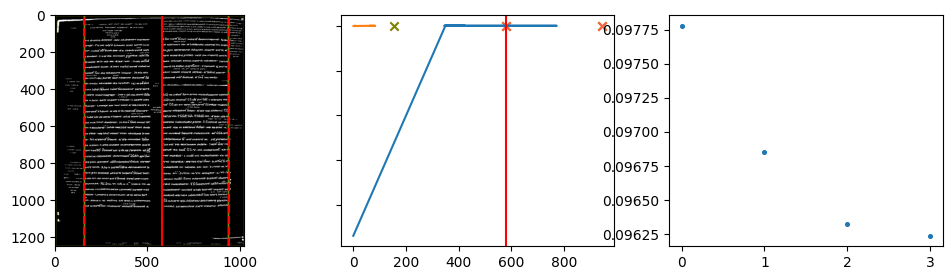

> [(155, 'x', 3865.0247879115745, 1.6963880138878267), None, None, (945, 'x', 2841.5552654922044, 6.765362711079433)]
---> [(155, 'x', 3865.0247879115745, 1.6963880138878267), (507, 'x', 44380.76211107279, 692.0724137789439), (930, 'x', 44433.72337838572, 15.84706273995107), (945, 'x', 2841.5552654922044, 6.765362711079433)]
yet (507, 'x', 44380.76211107279, 692.0724137789439)
---> new split at 507
DEPTH = 16
chrono [[0, 0.09777849324837061, 157, 'x'], [1, 0.09685282184740565, 939, 'x'], [1, 0.0963211517315326, 582, 'x'], [None, 0.09623744677010615, None, None]]
done [[0, 0, 157, 1251, 3866.7211759254624, None], [157, 0, 507, 1251, None, None], [507, 0, 582, 1251, None, None], [582, 0, 939, 1251, 44449.570441125674, None], [939, 0, 1024, 1251, 2848.320628203284, None]]
yet [(155, 'x', 3865.0247879115745, 1.6963880138878267), None, None, (930, 'x', 44433.72337838572, 15.84706273995107), (945, 'x', 2841.5552654922044, 6.765362711079433)]


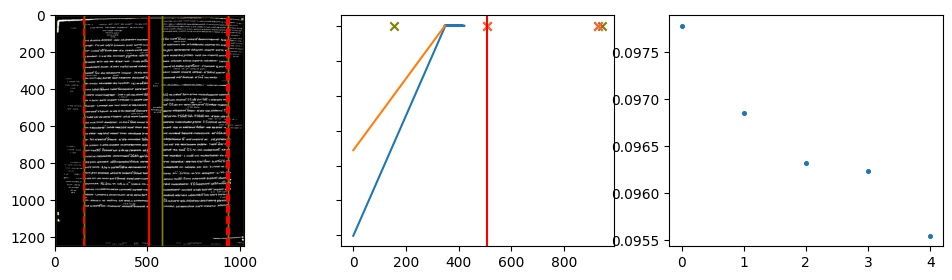

> [(155, 'x', 3865.0247879115745, 1.6963880138878267), None, None, (930, 'x', 44433.72337838572, 15.84706273995107), (945, 'x', 2841.5552654922044, 6.765362711079433)]
---> [(155, 'x', 3865.0247879115745, 1.6963880138878267), (503, 'x', 42941.0490555528, 0.4942332444697968), (578, 'x', 1423.1350581506777, 16.083764124841764), (930, 'x', 44433.72337838572, 15.84706273995107), (945, 'x', 2841.5552654922044, 6.765362711079433)]
yet (578, 'x', 1423.1350581506777, 16.083764124841764)
---> new split at 578
DEPTH = 15
chrono [[0, 0.09777849324837061, 157, 'x'], [1, 0.09685282184740565, 939, 'x'], [1, 0.0963211517315326, 582, 'x'], [1, 0.09623744677010615, 507, 'x'], [None, 0.0955453743563272, None, None]]
done [[0, 0, 157, 1251, 3866.7211759254624, None], [157, 0, 507, 1251, 42941.54328879727, None], [507, 0, 578, 1251, None, None], [578, 0, 582, 1251, None, None], [582, 0, 939, 1251, 44449.570441125674, None], [939, 0, 1024, 1251, 2848.320628203284, None]]
yet [(155, 'x', 3865.0247879115745,

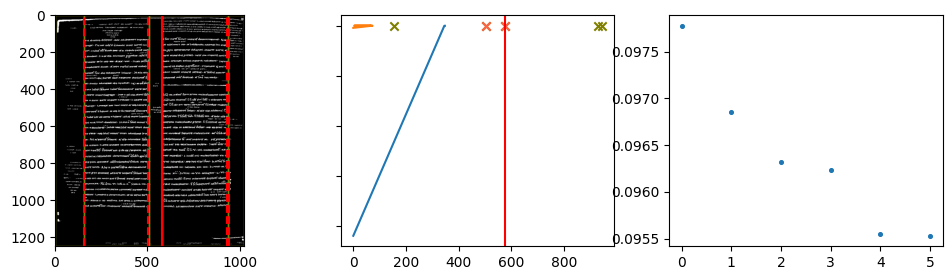

> [(155, 'x', 3865.0247879115745, 1.6963880138878267), (503, 'x', 42941.0490555528, 0.4942332444697968), None, None, (930, 'x', 44433.72337838572, 15.84706273995107), (945, 'x', 2841.5552654922044, 6.765362711079433)]
---> [(155, 'x', 3865.0247879115745, 1.6963880138878267), (503, 'x', 42941.0490555528, 0.4942332444697968), (511, 'x', 1081.1978118997179, 12.980411718578353), (580, 'x', 328.1886490807473, 0.7681854516339968), (930, 'x', 44433.72337838572, 15.84706273995107), (945, 'x', 2841.5552654922044, 6.765362711079433)]
yet (930, 'x', 44433.72337838572, 15.84706273995107)
---> new split at 930
DEPTH = 14
chrono [[0, 0.09777849324837061, 157, 'x'], [1, 0.09685282184740565, 939, 'x'], [1, 0.0963211517315326, 582, 'x'], [1, 0.09623744677010615, 507, 'x'], [2, 0.0955453743563272, 578, 'x'], [None, 0.09552929059220236, None, None]]
done [[0, 0, 157, 1251, 3866.7211759254624, None], [157, 0, 507, 1251, 42941.54328879727, None], [507, 0, 578, 1251, 1094.1782236182962, None], [578, 0, 582,

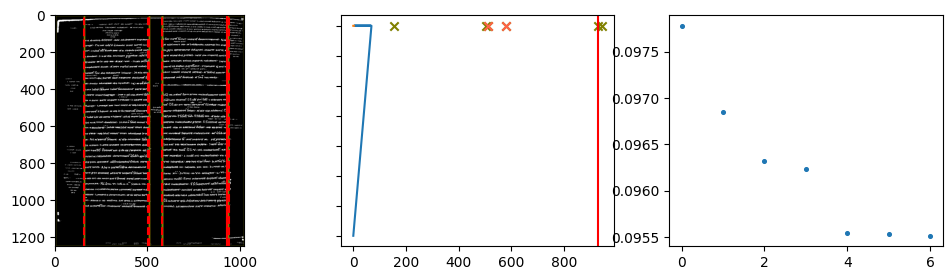

> [(155, 'x', 3865.0247879115745, 1.6963880138878267), (503, 'x', 42941.0490555528, 0.4942332444697968), (511, 'x', 1081.1978118997179, 12.980411718578353), (580, 'x', 328.1886490807473, 0.7681854516339968), None, None, (945, 'x', 2841.5552654922044, 6.765362711079433)]
---> [(155, 'x', 3865.0247879115745, 1.6963880138878267), (503, 'x', 42941.0490555528, 0.4942332444697968), (511, 'x', 1081.1978118997179, 12.980411718578353), (580, 'x', 328.1886490807473, 0.7681854516339968), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (945, 'x', 2841.5552654922044, 6.765362711079433)]
yet (511, 'x', 1081.1978118997179, 12.980411718578353)
---> new split at 511
DEPTH = 13
chrono [[0, 0.09777849324837061, 157, 'x'], [1, 0.09685282184740565, 939, 'x'], [1, 0.0963211517315326, 582, 'x'], [1, 0.09623744677010615, 507, 'x'], [2, 0.0955453743563272, 578, 'x'], [4, 0.09552929059220236, 930, 'x'], [None, 0.09551344352946241, None, None]]
done [[0

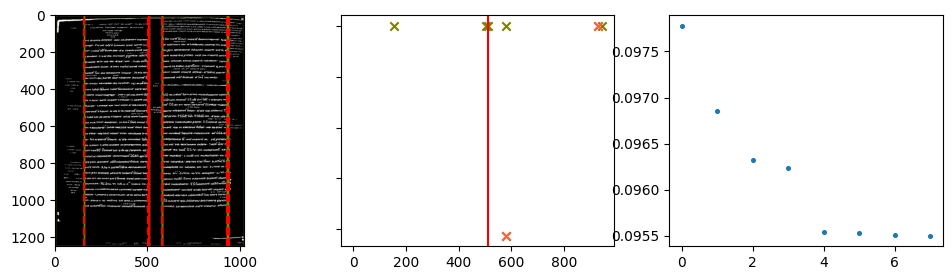

> [(155, 'x', 3865.0247879115745, 1.6963880138878267), (503, 'x', 42941.0490555528, 0.4942332444697968), None, None, (580, 'x', 328.1886490807473, 0.7681854516339968), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (945, 'x', 2841.5552654922044, 6.765362711079433)]
---> [(155, 'x', 3865.0247879115745, 1.6963880138878267), (503, 'x', 42941.0490555528, 0.4942332444697968), (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (580, 'x', 328.1886490807473, 0.7681854516339968), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (945, 'x', 2841.5552654922044, 6.765362711079433)]
yet (945, 'x', 2841.5552654922044, 6.765362711079433)
---> new split at 945
DEPTH = 12
chrono [[0, 0.09777849324837061, 157, 'x'], [1, 0.09685282184740565, 939, 'x'], [1, 0.0963211517315326, 582, 'x'], [1, 0.09623744677010615, 507, 'x'], [2, 0.095545374356

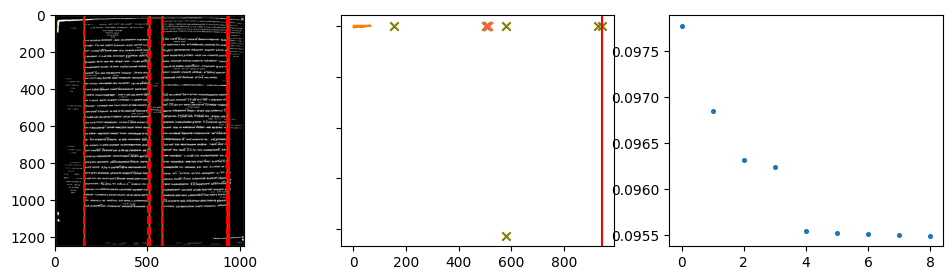

> [(155, 'x', 3865.0247879115745, 1.6963880138878267), (503, 'x', 42941.0490555528, 0.4942332444697968), (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (580, 'x', 328.1886490807473, 0.7681854516339968), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), None, None]
---> [(155, 'x', 3865.0247879115745, 1.6963880138878267), (503, 'x', 42941.0490555528, 0.4942332444697968), (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (580, 'x', 328.1886490807473, 0.7681854516339968), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 422888310216.0, -422888309815.951), (1007, 'x', 2440.210661831069, 1.2955762164219777)]
yet (155, 'x', 3865.0247879115745, 1.6963880138878267)
---> new split at 155
DEPTH = 11
chrono [[0, 0.09777849324837061, 157, 'x'], [1, 0.09685282184740565, 939

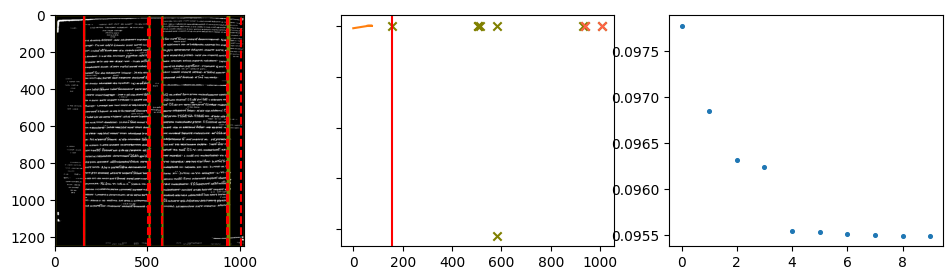

> [None, None, (503, 'x', 42941.0490555528, 0.4942332444697968), (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (580, 'x', 328.1886490807473, 0.7681854516339968), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 422888310216.0, -422888309815.951), (1007, 'x', 2440.210661831069, 1.2955762164219777)]
---> [(80, 'x', 3754.7257134292386, 0.5848458652285444), (155, 'x', 15662530008.0, -15662529898.285772), (503, 'x', 42941.0490555528, 0.4942332444697968), (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (580, 'x', 328.1886490807473, 0.7681854516339968), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 422888310216.0, -422888309815.951), (1007, 'x', 2440.210661831069, 1.2955762164219777)]
yet (1007, 'x', 2440.210661831069, 1.2955762164219777)
---> new sp

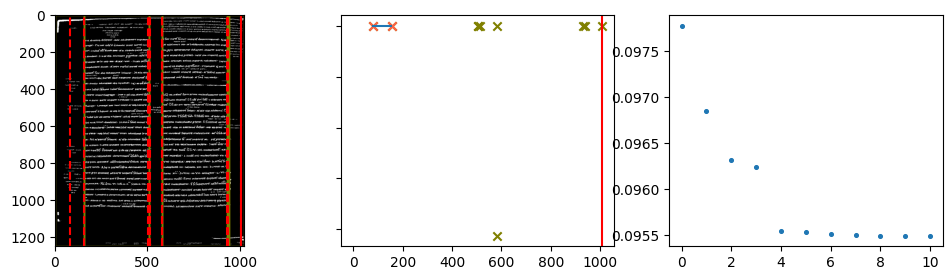

> [(80, 'x', 3754.7257134292386, 0.5848458652285444), (155, 'x', 15662530008.0, -15662529898.285772), (503, 'x', 42941.0490555528, 0.4942332444697968), (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (580, 'x', 328.1886490807473, 0.7681854516339968), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 422888310216.0, -422888309815.951), None, None]
---> [(80, 'x', 3754.7257134292386, 0.5848458652285444), (155, 'x', 15662530008.0, -15662529898.285772), (503, 'x', 42941.0490555528, 0.4942332444697968), (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (580, 'x', 328.1886490807473, 0.7681854516339968), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 422888310216.0, -422888309815.951), (1003, 'x', 2055.4175625016987, 0.018566014845418977), (1021, 'x', 384.

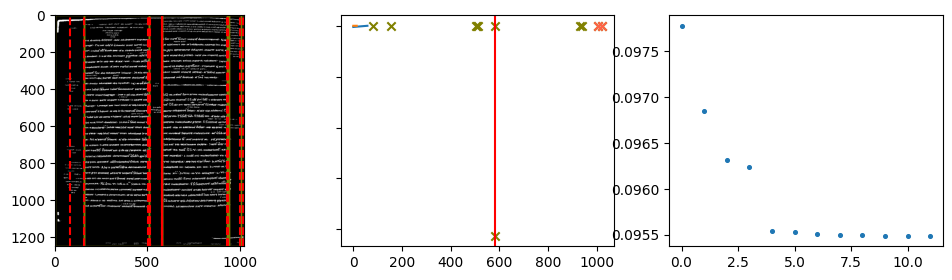

> [(80, 'x', 3754.7257134292386, 0.5848458652285444), (155, 'x', 15662530008.0, -15662529898.285772), (503, 'x', 42941.0490555528, 0.4942332444697968), (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), None, None, (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 422888310216.0, -422888309815.951), (1003, 'x', 2055.4175625016987, 0.018566014845418977), (1021, 'x', 384.39661604050013, 0.37791727402498054)]
---> [(80, 'x', 3754.7257134292386, 0.5848458652285444), (155, 'x', 15662530008.0, -15662529898.285772), (503, 'x', 42941.0490555528, 0.4942332444697968), (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (578, 'x', 15662530008.0, -15662529870.519585), (580, 'x', 15662530008.0, -15662529817.291767), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 4228

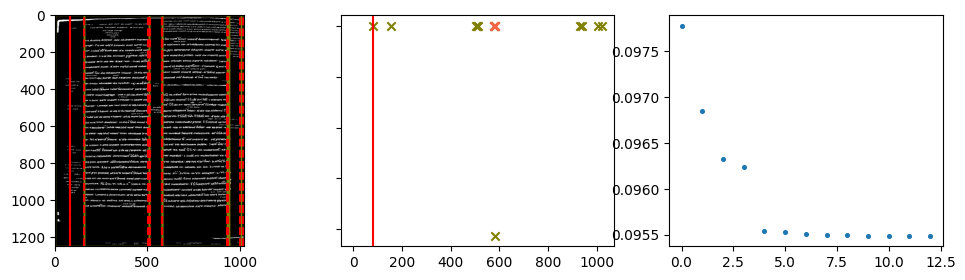

> [None, None, (155, 'x', 15662530008.0, -15662529898.285772), (503, 'x', 42941.0490555528, 0.4942332444697968), (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (578, 'x', 15662530008.0, -15662529870.519585), (580, 'x', 15662530008.0, -15662529817.291767), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 422888310216.0, -422888309815.951), (1003, 'x', 2055.4175625016987, 0.018566014845418977), (1021, 'x', 384.39661604050013, 0.37791727402498054)]
---> [None, (153, 'x', 1977.8945501133223, 0.5298143950360554), (155, 'x', 15662530008.0, -15662529898.285772), (503, 'x', 42941.0490555528, 0.4942332444697968), (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (578, 'x', 15662530008.0, -15662529870.519585), (580, 'x', 15662530008.0, -15662529817.291767), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 14

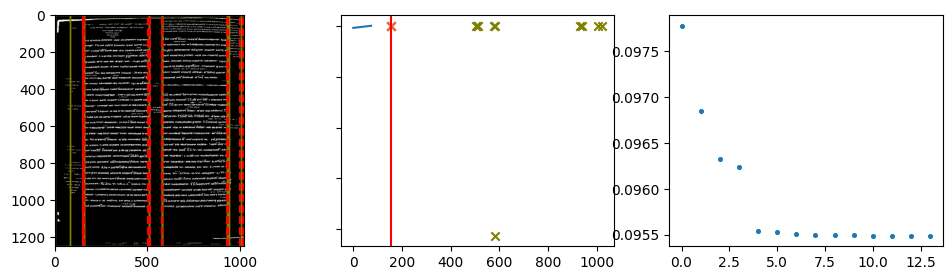

> [None, None, None, (155, 'x', 15662530008.0, -15662529898.285772), (503, 'x', 42941.0490555528, 0.4942332444697968), (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (578, 'x', 15662530008.0, -15662529870.519585), (580, 'x', 15662530008.0, -15662529817.291767), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 422888310216.0, -422888309815.951), (1003, 'x', 2055.4175625016987, 0.018566014845418977), (1021, 'x', 384.39661604050013, 0.37791727402498054)]
---> [None, (80, 'x', 761623804515267.0, -761623804513307.0), (153, 'x', 15662530008.0, -15662529990.129496), (155, 'x', 15662530008.0, -15662529898.285772), (503, 'x', 42941.0490555528, 0.4942332444697968), (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (578, 'x', 15662530008.0, -15662529870.519585), (580, 'x', 15662530008.0, -15662529817.291767), (582, 'x', 8.251058

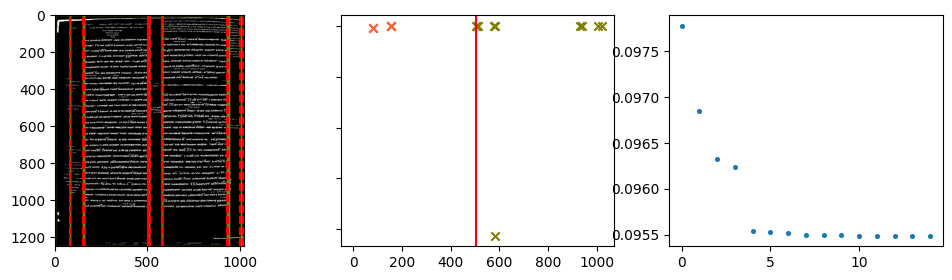

> [None, (80, 'x', 761623804515267.0, -761623804513307.0), (153, 'x', 15662530008.0, -15662529990.129496), (155, 'x', 15662530008.0, -15662529898.285772), None, None, (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (578, 'x', 15662530008.0, -15662529870.519585), (580, 'x', 15662530008.0, -15662529817.291767), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 422888310216.0, -422888309815.951), (1003, 'x', 2055.4175625016987, 0.018566014845418977), (1021, 'x', 384.39661604050013, 0.37791727402498054)]
---> [None, (80, 'x', 761623804515267.0, -761623804513307.0), (153, 'x', 15662530008.0, -15662529990.129496), (155, 'x', 15662530008.0, -15662529898.285772), (157, 'x', 8.109614788543174e+16, -8.109614788538933e+16), (505, 'x', 527.5063948840846, 1.3111510791463843), (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (578, '

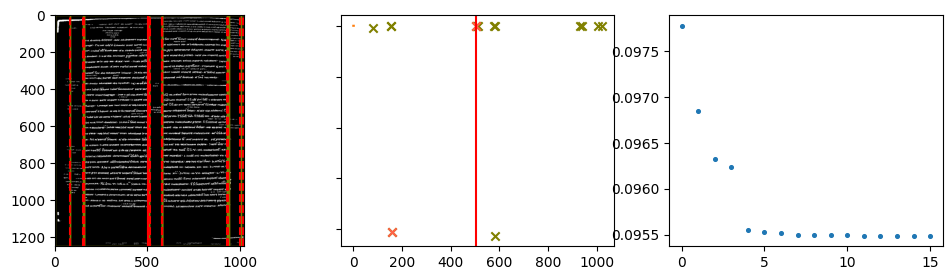

> [None, (80, 'x', 761623804515267.0, -761623804513307.0), (153, 'x', 15662530008.0, -15662529990.129496), (155, 'x', 15662530008.0, -15662529898.285772), (157, 'x', 8.109614788543174e+16, -8.109614788538933e+16), None, None, (507, 'x', 125300240064.0, -125300239773.20464), (513, 'x', 789.921170755701, 0.4812774349903748), (578, 'x', 15662530008.0, -15662529870.519585), (580, 'x', 15662530008.0, -15662529817.291767), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 422888310216.0, -422888309815.951), (1003, 'x', 2055.4175625016987, 0.018566014845418977), (1021, 'x', 384.39661604050013, 0.37791727402498054)]
---> [None, (80, 'x', 761623804515267.0, -761623804513307.0), (153, 'x', 15662530008.0, -15662529990.129496), (155, 'x', 15662530008.0, -15662529898.285772), (157, 'x', 8.109614788543174e+16, -8.109614788538933e+16), (503, 'x', 15662530008.0, -15662529713.47522), (505, 'x', 15662530008.0, -15662529775.018385), (50

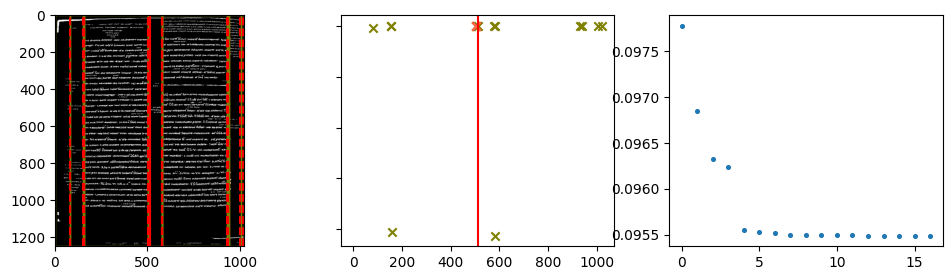

> [None, (80, 'x', 761623804515267.0, -761623804513307.0), (153, 'x', 15662530008.0, -15662529990.129496), (155, 'x', 15662530008.0, -15662529898.285772), (157, 'x', 8.109614788543174e+16, -8.109614788538933e+16), (503, 'x', 15662530008.0, -15662529713.47522), (505, 'x', 15662530008.0, -15662529775.018385), (507, 'x', 125300240064.0, -125300239773.20464), None, None, (578, 'x', 15662530008.0, -15662529870.519585), (580, 'x', 15662530008.0, -15662529817.291767), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 422888310216.0, -422888309815.951), (1003, 'x', 2055.4175625016987, 0.018566014845418977), (1021, 'x', 384.39661604050013, 0.37791727402498054)]
---> [None, (80, 'x', 761623804515267.0, -761623804513307.0), (153, 'x', 15662530008.0, -15662529990.129496), (155, 'x', 15662530008.0, -15662529898.285772), (157, 'x', 8.109614788543174e+16, -8.109614788538933e+16), (503, 'x', 15662530008.0, -15662529713.47522), (505, 

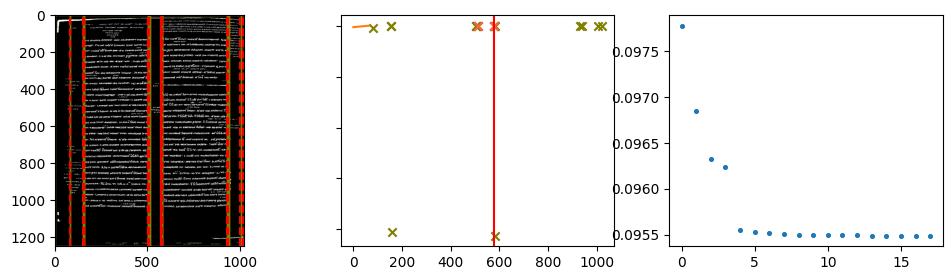

> [None, (80, 'x', 761623804515267.0, -761623804513307.0), (153, 'x', 15662530008.0, -15662529990.129496), (155, 'x', 15662530008.0, -15662529898.285772), (157, 'x', 8.109614788543174e+16, -8.109614788538933e+16), (503, 'x', 15662530008.0, -15662529713.47522), (505, 'x', 15662530008.0, -15662529775.018385), (507, 'x', 125300240064.0, -125300239773.20464), (511, 'x', 15662530008.0, -15662529951.344524), None, None, (578, 'x', 15662530008.0, -15662529870.519585), (580, 'x', 15662530008.0, -15662529817.291767), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 422888310216.0, -422888309815.951), (1003, 'x', 2055.4175625016987, 0.018566014845418977), (1021, 'x', 384.39661604050013, 0.37791727402498054)]
---> [None, (80, 'x', 761623804515267.0, -761623804513307.0), (153, 'x', 15662530008.0, -15662529990.129496), (155, 'x', 15662530008.0, -15662529898.285772), (157, 'x', 8.109614788543174e+16, -8.109614788538933e+16), (503,

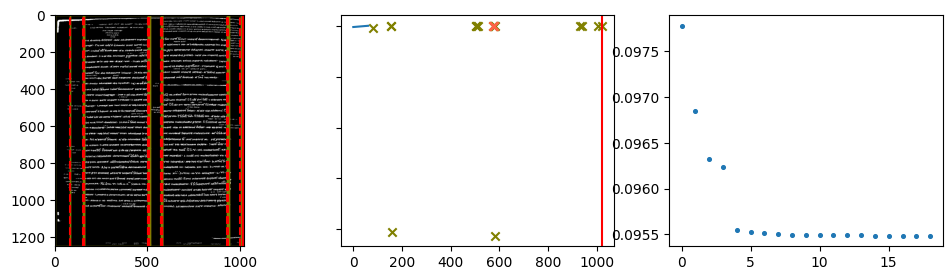

> [None, (80, 'x', 761623804515267.0, -761623804513307.0), (153, 'x', 15662530008.0, -15662529990.129496), (155, 'x', 15662530008.0, -15662529898.285772), (157, 'x', 8.109614788543174e+16, -8.109614788538933e+16), (503, 'x', 15662530008.0, -15662529713.47522), (505, 'x', 15662530008.0, -15662529775.018385), (507, 'x', 125300240064.0, -125300239773.20464), (511, 'x', 15662530008.0, -15662529951.344524), (574, 'x', 679.0419795311186, 0.0043706902721396546), (576, 'x', 15662530008.0, -15662529954.209032), (578, 'x', 15662530008.0, -15662529870.519585), (580, 'x', 15662530008.0, -15662529817.291767), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 422888310216.0, -422888309815.951), (1003, 'x', 2055.4175625016987, 0.018566014845418977), None, None]
---> [None, (80, 'x', 761623804515267.0, -761623804513307.0), (153, 'x', 15662530008.0, -15662529990.129496), (155, 'x', 15662530008.0, -15662529898.285772), (157, 'x', 8.109

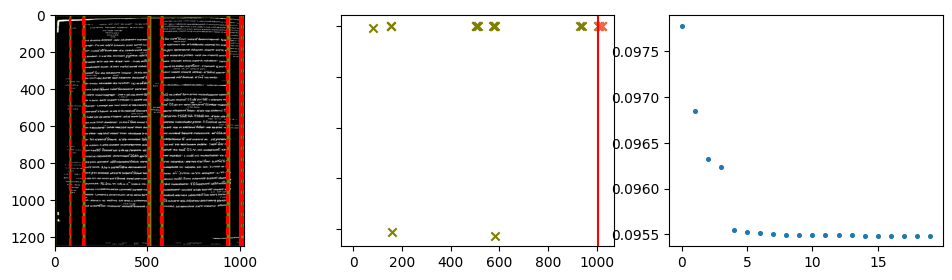

> [None, (80, 'x', 761623804515267.0, -761623804513307.0), (153, 'x', 15662530008.0, -15662529990.129496), (155, 'x', 15662530008.0, -15662529898.285772), (157, 'x', 8.109614788543174e+16, -8.109614788538933e+16), (503, 'x', 15662530008.0, -15662529713.47522), (505, 'x', 15662530008.0, -15662529775.018385), (507, 'x', 125300240064.0, -125300239773.20464), (511, 'x', 15662530008.0, -15662529951.344524), (574, 'x', 679.0419795311186, 0.0043706902721396546), (576, 'x', 15662530008.0, -15662529954.209032), (578, 'x', 15662530008.0, -15662529870.519585), (580, 'x', 15662530008.0, -15662529817.291767), (582, 'x', 8.25105839828642e+16, -8.251058398282054e+16), (930, 'x', 1427248046979.0, -1427248046197.4182), (939, 'x', 422888310216.0, -422888309815.951), None, None, (1007, 'x', 5372247792744.0, -5372247792394.277), (1021, 'x', 52861038777.0, -52861038742.32641)]
---> [None, (80, 'x', 761623804515267.0, -761623804513307.0), (153, 'x', 15662530008.0, -15662529990.129496), (155, 'x', 1566253000

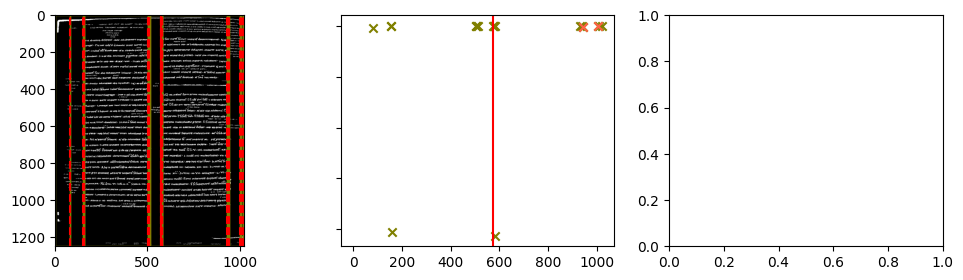

slope = -7.525939821530908e-07


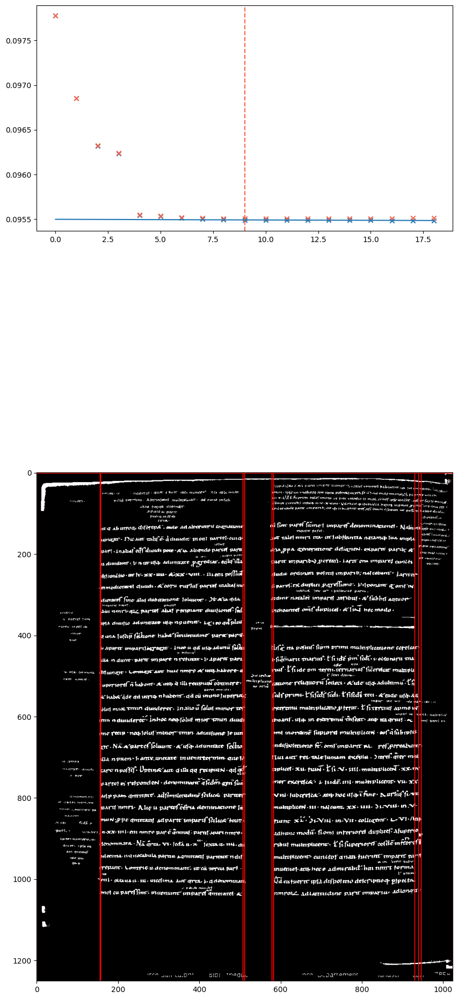

In [117]:
borders = [a[0] for a in areas] + [a[2] for a in areas]
# positions = np.unique(borders)
hist,vals = np.histogram(borders,bins=general_mask.shape[1]//2)
positions = [int(vals[i]) for i in np.argsort(hist)[::-1][:20]]
# print(positions)
res = cart_regression_bi_simul(general_mask, mean_squared_error, uni_axis='x', positions=positions, start=8, max_depth=len(positions), verbose=True)

In [84]:
print(res)

[(0, 0, 287, 5119), (287, 0, 299, 5119), (299, 0, 583, 5119), (583, 0, 615, 5119), (615, 0, 775, 5119), (775, 0, 811, 5119), (811, 0, 915, 5119), (915, 0, 1451, 5119), (1451, 0, 2242, 5119), (2242, 0, 2298, 5119), (2298, 0, 3770, 5119)]


In [ ]:
for x,y,x_,y_ in res[6:7]:
    small_image = general_mask[y:y_, x:x_]
    borders = [a[1] for a in areas if (a[0]-x_)*(a[2]-x) < 0] + [a[3] for a in areas if (a[0]-x_)*(a[2]-x) < 0]

    # positions = np.unique(borders)
    hist,vals = np.histogram(borders,bins=general_mask.shape[1]//2)
    positions = [int(vals[i]) for i in np.argsort(hist)[::-1][:5]]
    # print(positions)
    res = cart_regression_bi_simul(small_image, mean_squared_error, uni_axis='y', positions=positions, start=8, max_depth=len(positions), verbose=True)

In [ ]:
fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(20,10))
ax0.imshow(image)
ax1.imshow(image)
angles = []
for i in range(len(areas)):
    # print(i, areas[i], end='')
    x,y,x_,y_ = areas[i]
    rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False)
    ax0.add_patch(rect)
    # rect = patches.Rectangle((x,y),x_-x,y_-y)
    # find line
    line = cv2.HoughLines(np.uint8(masks[i]), 1, np.pi/180,int(masks[i].shape[1]/2.5))
    # print(len(line))
    if line is not None:
        line = line.squeeze(axis=1)
        # rho = line[0,0] # np.mean(line[:,0])
        # theta = line[0,1] # np.mean(line[:,1])
        # rho = np.mean(line[:,0])
        theta = np.mean(line[:,1])
        angles.append(theta)
        # a = np.cos(-theta-np.pi/2)
        # b = np.sin(-theta-np.pi/2)
        
        # y0 = y # int((rho-x0*np.cos(theta))/np.sin(theta))
        # x0 = int((rho-y0*np.sin(theta))/np.cos(theta)) # x
        # # x0 = max(x0,x)
        # # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))

        # y1 = y_ # int((rho-x1*np.cos(theta))/np.sin(theta))
        # x1 = int((rho-y1*np.sin(theta))/np.cos(theta)) # x_
        # # x1 = min(x1,x_)
        # # y1 = int((rho-x1*np.cos(theta))/np.sin(theta))

        # x0 = int((x_-x)/2)
        # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
        # ax1.axline((x0,y0),slope=-b/a,color='turquoise')
        # rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False)
        # ax1.add_patch(rect)
        # rad = -theta-np.pi/2
        rad = theta
        rad = rad - np.pi if rad > np.pi/2 else -rad
        # rad = theta
        rect = patches.Rectangle((x,y),x_-x,y_-y, angle=rad,color='teal',fill=False)
        ax1.add_patch(rect)
        
        
        # print(x,x0,y,y0,x_,x1,y_,y1)
        # ax1.plot([x0,x1],[y0,y1],color='turquoise',linewidth=3)

        # print('Yeah')
    # else:
        # print('None')
print(np.pi/2 - np.array(angles))
image = rectify(image, rad=np.pi/2 - np.median(angles))
ax2.imshow(image)
plt.show()

In [ ]:
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas, masks, general_mask = get_connected_components_dbscan(bw, eps_y=2, colored=image)

In [ ]:
text, non_text = filter_text(image, areas, masks=masks)

In [98]:
sorttext = np.argsort([masks[t].size for t in non_text])

In [107]:
5000*2e-3

10.0

In [108]:
print(len(sorttext))

40


In [ ]:
for i in sorttext[:][::-1]:
    # i+=30
    # x,y,x_,y_ = areas[i]
    i = non_text[i]
    # print(i)
    plt.imshow(1-masks[i], cmap='gray')
    plt.show()
    is_text_line(1-masks[i], eps=0.15)

In [ ]:
for i in sorttext[:20]:
    # i+=30
    i = text[i]
    print(i)
    is_text_line(1-masks[i], eps=0.2)
    x,y,x_,y_ = areas[i]
    fig, ((ax0, ax1, ax2), (ax0_, ax1_, ax2_)) = plt.subplots(2,3,figsize=(17,14))

    # ax1.imshow(r,cmap='gray')
    # find line
    # line = cv2.HoughLines(np.uint8(bw[y:y_,x:x_]), 1, np.pi/180,int((x_-x)/2.5))
    # print(len(line))
    # if line is not None:
    #     line = line.squeeze(axis=1)
    #     for rho, theta in line[:10]:
    #         # print(rho, theta)
    #         a = np.cos(-theta-np.pi/2)
    #         b = np.sin(-theta-np.pi/2)
    #         x0 = int((x_-x)/2)
    #         y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
    #         # print(x0,y0)
    #         ax1.axline((x0,y0),slope=-b/a,color='tomato',linestyle='dashed')
    r = gray[y:y_,x:x_]
    ax0.imshow(r,cmap='gray')
    horizontal_mean = np.mean(r,axis=1)
    vertical_mean = np.mean(r,axis=0)
    general_mean = np.mean(r)
    ax1.plot(horizontal_mean)
    ax1.axhline(general_mean,color='tomato')
    ax2.plot(vertical_mean)
    ax2.axhline(general_mean,color='tomato')
    
    r = 1-masks[i]
    ax0_.imshow(r,cmap='gray')    
    horizontal_mean = np.mean(r,axis=1)
    vertical_mean = np.mean(r,axis=0)
    general_mean = np.mean(r)
    ax1_.plot(horizontal_mean)
    ax1_.axhline(general_mean,color='tomato')
    ax2_.plot(vertical_mean)
    ax2_.axhline(general_mean,color='tomato')

    plt.show()
    fig, (ax1, ax3) = plt.subplots(2,1,figsize=(15,8), height_ratios=(4,4), layout='constrained')
    ax1.imshow(r,cmap='gray')#, aspect='auto')
    # ax1.autoscale(False)
    
    ax3.plot(vertical_mean)#, aspect='auto')
    # asp = np.diff(ax1.get_xlim())[0] / np.diff(ax1.get_ylim())[0]
    # ax3.set_aspect(asp)
    ax3.axhline(general_mean,color='tomato')
    ax3.margins(x=0)
    # ax3.autoscale(False)
    cpt = 0
    for i in range(len(vertical_mean)-1):
        if (general_mean - vertical_mean[i])*(general_mean - vertical_mean[i+1]) < 0:
            ax3.axvline(i,color='tomato',linestyle='dashed')
            ax1.axvline(i,color='tomato')
            cpt+=1
    print(cpt, 'over', len(vertical_mean), '-->', cpt/len(vertical_mean))
    plt.show() 

In [ ]:
from sklearn.metrics import mean_squared_error
def ponderated_criterion_multi_splits(image,criterion,splits,axis='x'):
    splits.sort()
    splits = [0] + splits + [image.shape[1]]
    # print('--->',splits)
    return np.sum([criterion(image[:,splits[i]:splits[i+1]],\
                             np.zeros_like(image[:,splits[i]:splits[i+1]])\
                                +np.mean(image[:,splits[i]:splits[i+1]])) \
                                    * image[:,splits[i]:splits[i+1]].size \
                                    for i in range(len(splits)-1) if image[:,splits[i]:splits[i+1]].size > 0])

borders = [i for i,_,_,_ in areas] + [i for _,_,i,_ in areas]
print(len(borders))
# values, counts = np.unique(borders, return_counts=True)
# print(values, counts)
# plt.hist(borders,bins=50)
# plt.show()
hist,vals = np.histogram(borders,bins=image.shape[1]//2)
plt.figure(figsize=(7,10))
plt.imshow(image)
alpha = 1
splits = []
homo = [ponderated_criterion_multi_splits(norm_image,mean_squared_error,splits)]
print(homo)
for i in np.argsort(hist)[::-1][:30]:
    plt.axvline(vals[i], linewidth=1, alpha=alpha)
    alpha *= 0.9
    splits.append(int(vals[i]))
    # print(vals[i])
    # print(splits)
    homo.append(ponderated_criterion_multi_splits(norm_image,mean_squared_error,splits))
plt.show()

start = 10
x = np.reshape(np.array([[i,1] for i in range(start,len(homo))]),(-1,2))
y = np.reshape(np.array([s for s in homo[start:]]),(-1,1))
slope,intercept = np.squeeze(np.linalg.inv(x.T@x)@x.T@y)
crit = np.array([homo[i]-2*slope*i for i in range(len(homo))])
plt.plot(homo, marker='.')
plt.scatter(np.arange(len(homo)),crit,marker='.',color='tomato')
plt.axvline(np.argmin(crit),color='tomato')
plt.show()

alpha = 1
plt.figure(figsize=(7,10))
plt.imshow(image)
for i in np.argsort(hist)[::-1][:np.argmin(crit)]:
    plt.axvline(vals[i], linewidth=1)
plt.show()

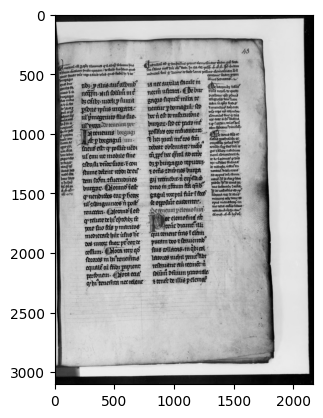

In [6]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Julien/Lat 12883_45r.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

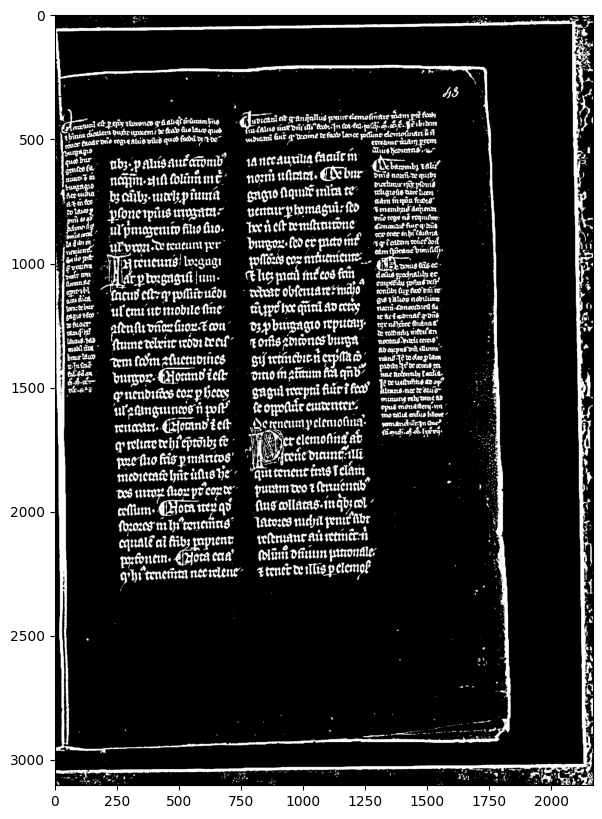

scale= 2
1084
14 2
contains 242494 white pixels
173 clusters found with DBSCAN algorithm
---> 3103 2168
- cluster 1 covers 10449 pixel.
- cluster 2 covers 5052 pixel.
- cluster 3 covers 17533 pixel.
- cluster 4 covers 4455 pixel.
- cluster 5 covers 12208 pixel.
- cluster 6 covers 44 pixel.
- cluster 7 covers 1953 pixel.
- cluster 8 covers 87 pixel.
- cluster 9 covers 4070 pixel.
- cluster 10 covers 879 pixel.
- cluster 11 covers 455 pixel.
- cluster 12 covers 435 pixel.
- cluster 13 covers 469 pixel.
- cluster 14 covers 52 pixel.
- cluster 15 covers 409 pixel.
- cluster 16 covers 338 pixel.
- cluster 17 covers 328 pixel.
- cluster 18 covers 322 pixel.
- cluster 19 covers 344 pixel.
- cluster 20 covers 332 pixel.
- cluster 21 covers 341 pixel.
- cluster 22 covers 291 pixel.
- cluster 23 covers 41 pixel.
- cluster 24 covers 4519 pixel.
- cluster 25 covers 2230 pixel.
- cluster 26 covers 2191 pixel.
- cluster 27 covers 2080 pixel.
- cluster 28 covers 2048 pixel.
- cluster 29 covers 1770 p

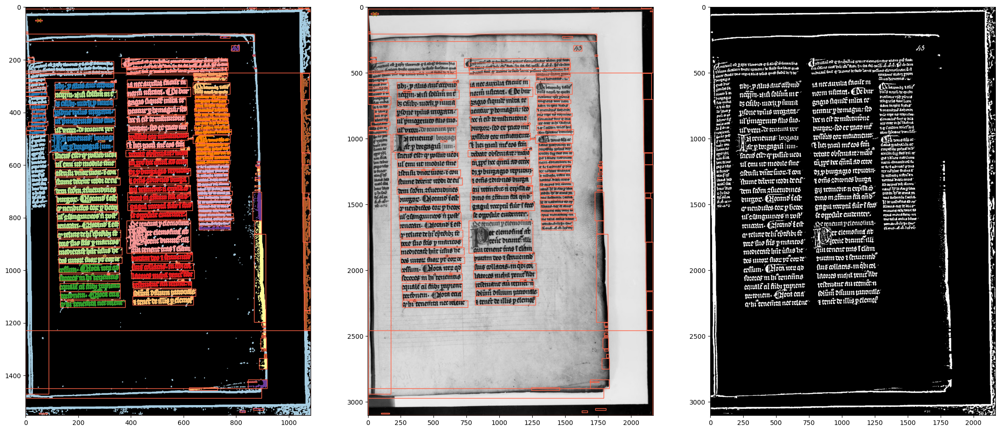

In [8]:
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas, masks, general_mask = get_connected_components_dbscan(bw, eps_y=2, colored=image)

0 (0, 12, 2166, 500)1 (0, 202, 1740, 260)2 (0, 966, 174, 2940)3 (0, 2898, 1792, 2972)4 (0, 2456, 2166, 3102)5 (2, 186, 18, 196)6 (0, 484, 670, 542)7 (20, 402, 62, 422)8 (0, 412, 670, 506)9 (0, 680, 174, 740)10 (0, 540, 148, 576)11 (0, 574, 158, 618)12 (0, 606, 158, 648)13 (18, 378, 64, 386)14 (0, 642, 160, 676)15 (4, 938, 148, 968)16 (6, 906, 158, 936)17 (22, 872, 168, 902)18 (30, 742, 166, 772)19 (48, 780, 152, 804)20 (46, 840, 156, 874)21 (48, 812, 152, 840)22 (100, 3084, 164, 3092)23 (190, 962, 668, 1102)24 (212, 774, 680, 832)25 (218, 840, 680, 896)26 (220, 570, 674, 628)27 (220, 704, 664, 758)28 (220, 908, 668, 958)29 (220, 1366, 686, 1420)30 (222, 628, 692, 696)31 (206, 1100, 690, 1154)32 (224, 1164, 682, 1216)33 (226, 1234, 702, 1284)34 (226, 1294, 718, 1350)35 (236, 1498, 700, 1552)36 (236, 1418, 696, 1494)37 (238, 1560, 706, 1622)38 (240, 1626, 710, 1684)39 (244, 1694, 722, 1754)40 (248, 1764, 718, 1820)41 (248, 1898, 734, 1948)42 (250, 1828, 732, 1882)43 (254, 1950, 710, 2018

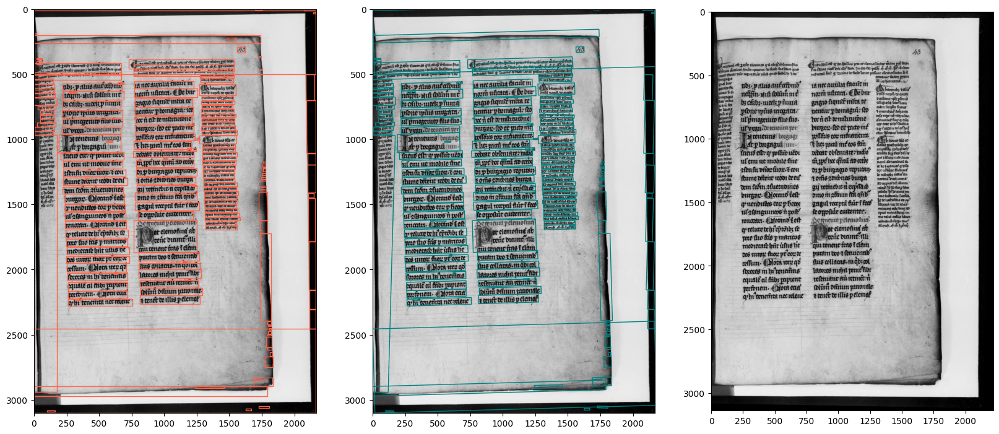

In [10]:
fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(20,10))
ax0.imshow(image)
ax1.imshow(image)
angles = []
for i in range(len(areas)):
    print(i, areas[i], end='')
    x,y,x_,y_ = areas[i]
    rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False)
    ax0.add_patch(rect)
    # rect = patches.Rectangle((x,y),x_-x,y_-y)
    # find line
    line = cv2.HoughLines(np.uint8(masks[i]), 1, np.pi/180,int(masks[i].shape[1]/2.5))
    # print(len(line))
    if line is not None:
        line = line.squeeze(axis=1)
        # rho = line[0,0] # np.mean(line[:,0])
        # theta = line[0,1] # np.mean(line[:,1])
        # rho = np.mean(line[:,0])
        theta = np.mean(line[:,1])
        angles.append(theta)
        # a = np.cos(-theta-np.pi/2)
        # b = np.sin(-theta-np.pi/2)
        
        # y0 = y # int((rho-x0*np.cos(theta))/np.sin(theta))
        # x0 = int((rho-y0*np.sin(theta))/np.cos(theta)) # x
        # # x0 = max(x0,x)
        # # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))

        # y1 = y_ # int((rho-x1*np.cos(theta))/np.sin(theta))
        # x1 = int((rho-y1*np.sin(theta))/np.cos(theta)) # x_
        # # x1 = min(x1,x_)
        # # y1 = int((rho-x1*np.cos(theta))/np.sin(theta))

        # x0 = int((x_-x)/2)
        # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
        # ax1.axline((x0,y0),slope=-b/a,color='turquoise')
        # rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False)
        # ax1.add_patch(rect)
        # rad = -theta-np.pi/2
        rad = theta
        rad = rad - np.pi if rad < np.pi/2 else rad
        # rad = theta
        rect = patches.Rectangle((x,y),x_-x,y_-y, angle=rad,color='teal',fill=False)
        ax1.add_patch(rect)
        
        
        # print(x,x0,y,y0,x_,x1,y_,y1)
        # ax1.plot([x0,x1],[y0,y1],color='turquoise',linewidth=3)

        # print('Yeah')
    # else:
        # print('None')
rotimg = rectify(image, rad=np.pi/2 - np.median(angles))
ax2.imshow(rotimg)
plt.show()

In [ ]:
new_gray = cv2.cvtColor(rotimg, cv2.COLOR_RGB2GRAY)
new_norm_image = new_gray/255.0
bw = black_white(cv2.GaussianBlur(new_gray,(5,5),0), threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas, masks = get_connected_components_dbscan(bw, eps_y=2, colored=rotimg)

In [ ]:
text, non_text = filter_text(rotimg, areas, masks=masks)

In [ ]:
from sklearn.metrics import mean_squared_error
def ponderated_criterion_multi_splits(image,criterion,splits,axis='x'):
    splits.sort()
    splits = [0] + splits + [image.shape[1]]
    # print('--->',splits)
    return np.sum([criterion(image[:,splits[i]:splits[i+1]],\
                             np.zeros_like(image[:,splits[i]:splits[i+1]])\
                                +np.mean(image[:,splits[i]:splits[i+1]])) \
                                    * image[:,splits[i]:splits[i+1]].size \
                                    for i in range(len(splits)-1) if image[:,splits[i]:splits[i+1]].size > 0])

borders = [areas[t][0] for t in text] + [areas[t][2] for t in text]
print(len(borders))
# values, counts = np.unique(borders, return_counts=True)
# print(values, counts)
# plt.hist(borders,bins=50)
# plt.show()
hist,vals = np.histogram(borders,bins=rotimg.shape[1]//2)
plt.figure(figsize=(7,10))
plt.imshow(rotimg)
alpha = 1
splits = []
homo = [ponderated_criterion_multi_splits(new_norm_image,mean_squared_error,splits)]
print(homo)
for i in np.argsort(hist)[::-1][:30]:
    plt.axvline(vals[i], linewidth=1, alpha=alpha)
    alpha *= 0.9
    splits.append(int(vals[i]))
    # print(vals[i])
    # print(splits)
    homo.append(ponderated_criterion_multi_splits(new_norm_image,mean_squared_error,splits))
plt.show()

start = 20
x = np.reshape(np.array([[i,1] for i in range(start,len(homo))]),(-1,2))
y = np.reshape(np.array([s for s in homo[start:]]),(-1,1))
slope,intercept = np.squeeze(np.linalg.inv(x.T@x)@x.T@y)
crit = np.array([homo[i]-2*slope*i for i in range(len(homo))])
plt.plot(homo, marker='.')
plt.scatter(np.arange(len(homo)),crit,marker='.',color='tomato')
plt.axvline(np.argmin(crit),color='tomato')
plt.show()

alpha = 1
plt.figure(figsize=(7,10))
plt.imshow(rotimg)
for i in np.argsort(hist)[::-1][:np.argmin(crit)]:
    plt.axvline(vals[i], linewidth=1)
plt.show()

In [142]:
sorttext = np.argsort([masks[t].size for t in text])

In [ ]:
for i in sorttext[:20]:
    # i+=30
    i = text[i]
    print(i)
    is_text_line(1-masks[i], eps=0.2)
    x,y,x_,y_ = areas[i]
    fig, ((ax0, ax1, ax2), (ax0_, ax1_, ax2_)) = plt.subplots(2,3,figsize=(17,14))

    # ax1.imshow(r,cmap='gray')
    # find line
    # line = cv2.HoughLines(np.uint8(bw[y:y_,x:x_]), 1, np.pi/180,int((x_-x)/2.5))
    # print(len(line))
    # if line is not None:
    #     line = line.squeeze(axis=1)
    #     for rho, theta in line[:10]:
    #         # print(rho, theta)
    #         a = np.cos(-theta-np.pi/2)
    #         b = np.sin(-theta-np.pi/2)
    #         x0 = int((x_-x)/2)
    #         y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
    #         # print(x0,y0)
    #         ax1.axline((x0,y0),slope=-b/a,color='tomato',linestyle='dashed')
    r = new_gray[y:y_,x:x_]
    ax0.imshow(r,cmap='gray')
    horizontal_mean = np.mean(r,axis=1)
    vertical_mean = np.mean(r,axis=0)
    general_mean = np.mean(r)
    ax1.plot(horizontal_mean)
    ax1.axhline(general_mean,color='tomato')
    ax2.plot(vertical_mean)
    ax2.axhline(general_mean,color='tomato')
    
    r = 1-masks[i]
    ax0_.imshow(r,cmap='gray')    
    horizontal_mean = np.mean(r,axis=1)
    vertical_mean = np.mean(r,axis=0)
    general_mean = np.mean(r)
    ax1_.plot(horizontal_mean)
    ax1_.axhline(general_mean,color='tomato')
    ax2_.plot(vertical_mean)
    ax2_.axhline(general_mean,color='tomato')

    plt.show()
    fig, (ax1, ax3) = plt.subplots(2,1,figsize=(15,8), height_ratios=(4,4), layout='constrained')
    ax1.imshow(r,cmap='gray')#, aspect='auto')
    # ax1.autoscale(False)
    
    ax3.plot(vertical_mean)#, aspect='auto')
    # asp = np.diff(ax1.get_xlim())[0] / np.diff(ax1.get_ylim())[0]
    # ax3.set_aspect(asp)
    ax3.axhline(general_mean,color='tomato')
    ax3.margins(x=0)
    # ax3.autoscale(False)
    cpt = 0
    for i in range(len(vertical_mean)-1):
        if (general_mean - vertical_mean[i])*(general_mean - vertical_mean[i+1]) < 0:
            ax3.axvline(i,color='tomato',linestyle='dashed')
            ax1.axvline(i,color='tomato')
            cpt+=1
    print(cpt, 'over', len(vertical_mean), '-->', cpt/len(vertical_mean))
    plt.show() 

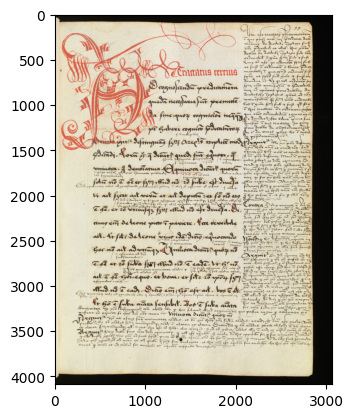

In [146]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Others/e-codices_kba-MurF0084_0099r_large.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
bw = black_white(cv2.GaussianBlur(gray,(5,5),0), threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas, masks = get_connected_components_dbscan(bw, eps_y=2, colored=image)

In [ ]:
text, non_text = filter_text(image, areas, masks=masks)

In [149]:
sortnontext = np.argsort([np.sum(masks[t]) for t in non_text])[::-1]
print(sortnontext)

[ 32  44   0   1  36  33  84  37  38  45  29  31  30  43  78  39  42  11
  85  64  87  16  17  86 116  19  61  23  14  22 129 134 135 133 123 152
 142 150 141 153 118 130 146 151 162 137 155 149 117 148 140 131 139 138
 161 143 147 157 132 158 156 160 144 154 136  34  21  12  96  54  94  90
 145  28 103  65 198  82  10  62   3  63 197  59  70 112  24  41 113   5
  93  95  83  46 100 194 124  76 120 111  81 102  97  89  73  69 105   4
   8 189  27  72 186 202  52 127  68 106 104  56 115  58  26  13 114 125
  15  20  50 126   6  57  55   9 191 187  98  47  80 101 119  92 165 110
  99 121  75 182 107  66  48 164  53  67 199 200  71 178  40 122   2 128
  51  35 195   7  74 163 215  79 175  49 174 185 179 201 109 176 183 177
 205  25  88 203 171 169 206 166 209 167 190 181 193 192 221 218 180 184
 173 108 196  60 220 159 212 204 213 170 168  18  91 222 223 210 207 172
 214 188 216 217  77 219 208 211]


In [ ]:
for i in [1]:
    # i+=30
    # i = non_text[i]
    print(i)
    is_text_line(1-masks[i], eps=0.2)
    x,y,x_,y_ = areas[i]
    fig, ((ax0, ax1, ax2), (ax0_, ax1_, ax2_)) = plt.subplots(2,3,figsize=(17,14))

    # ax1.imshow(r,cmap='gray')
    # find line
    # line = cv2.HoughLines(np.uint8(bw[y:y_,x:x_]), 1, np.pi/180,int((x_-x)/2.5))
    # print(len(line))
    # if line is not None:
    #     line = line.squeeze(axis=1)
    #     for rho, theta in line[:10]:
    #         # print(rho, theta)
    #         a = np.cos(-theta-np.pi/2)
    #         b = np.sin(-theta-np.pi/2)
    #         x0 = int((x_-x)/2)
    #         y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
    #         # print(x0,y0)
    #         ax1.axline((x0,y0),slope=-b/a,color='tomato',linestyle='dashed')

    r = 1-masks[i]
    ax0_.imshow(r,cmap='gray')    
    horizontal_mean = np.mean(r,axis=1)
    vertical_mean = np.mean(r,axis=0)
    general_mean = np.mean(r)
    ax1_.plot(horizontal_mean)
    ax1_.axhline(general_mean,color='tomato')
    ax2_.plot(vertical_mean)
    ax2_.axhline(general_mean,color='tomato')
    
    r = gray[y:y_,x:x_]
    ax0.imshow(r,cmap='gray')
    horizontal_mean = np.mean(r,axis=1)
    vertical_mean = np.mean(r,axis=0)
    general_mean = np.mean(r)
    ax1.plot(horizontal_mean)
    ax1.axhline(general_mean,color='tomato')
    ax2.plot(vertical_mean)
    ax2.axhline(general_mean,color='tomato')
    
    plt.show()
    fig, (ax1, ax3) = plt.subplots(2,1,figsize=(15,8), height_ratios=(4,4), layout='constrained')
    ax1.imshow(r,cmap='gray')#, aspect='auto')
    # ax1.autoscale(False)
    
    ax3.plot(vertical_mean)#, aspect='auto')
    # asp = np.diff(ax1.get_xlim())[0] / np.diff(ax1.get_ylim())[0]
    # ax3.set_aspect(asp)
    ax3.axhline(general_mean,color='tomato')
    ax3.margins(x=0)
    # ax3.autoscale(False)
    cpt = 0
    for i in range(len(vertical_mean)-1):
        if (general_mean - vertical_mean[i])*(general_mean - vertical_mean[i+1]) < 0:
            ax3.axvline(i,color='tomato',linestyle='dashed')
            ax1.axvline(i,color='tomato')
            cpt+=1
    print(cpt, 'over', len(vertical_mean), '-->', cpt/len(vertical_mean))
    plt.show() 

In [ ]:
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas, masks = get_connected_components_dbscan(bw, eps_x=10, eps_y=3, colored=image)

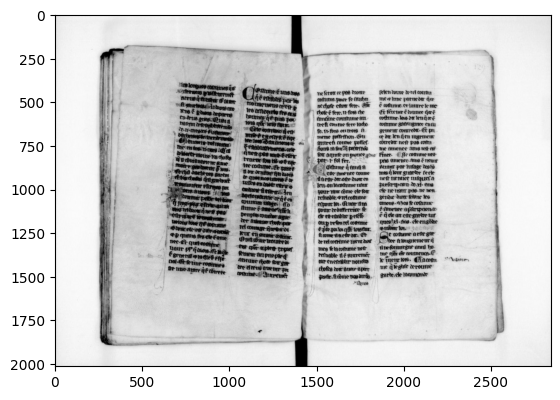

In [110]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Julien/Corpus B/Lat_14689_128v.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

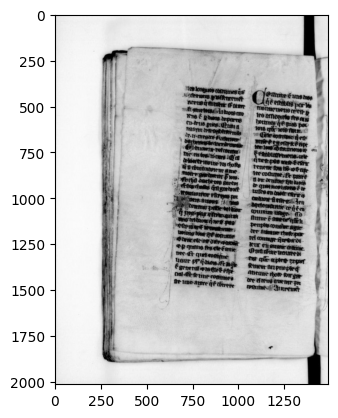

In [114]:
img = image[:,:1490]
plt.imshow(img)

In [ ]:
bw = black_white(gray[:,:1490], threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas, masks = get_connected_components_dbscan(bw, eps_x=15, eps_y=3, colored=image[:,:1490])

In [ ]:
all_angles = []
fig, (ax0, ax1) = plt.subplots(1,2,figsize=(14,10))
ax0.imshow(image[:,:1490])
ax1.imshow(image[:,:1490])
for i in range(len(areas)):
    print(i, areas[i], end='')
    x,y,x_,y_ = areas[i]
    rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False)
    ax0.add_patch(rect)
    # rect = patches.Rectangle((x,y),x_-x,y_-y)
    # find line
    line = cv2.HoughLines(np.uint8(masks[i]), 1, np.pi/180,int(masks[i].shape[1]/2.5))
    # print(len(line))
    if line is not None:
        line = line.squeeze(axis=1)
        # rho = line[0,0] # np.mean(line[:,0])
        # theta = line[0,1] # np.mean(line[:,1])
        # rho = np.mean(line[:,0])
        theta = np.mean(line[:,1])
        all_angles.append(theta)
        # a = np.cos(-theta-np.pi/2)
        # b = np.sin(-theta-np.pi/2)
        
        # y0 = y # int((rho-x0*np.cos(theta))/np.sin(theta))
        # x0 = int((rho-y0*np.sin(theta))/np.cos(theta)) # x
        # # x0 = max(x0,x)
        # # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))

        # y1 = y_ # int((rho-x1*np.cos(theta))/np.sin(theta))
        # x1 = int((rho-y1*np.sin(theta))/np.cos(theta)) # x_
        # # x1 = min(x1,x_)
        # # y1 = int((rho-x1*np.cos(theta))/np.sin(theta))

        # x0 = int((x_-x)/2)
        # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
        # ax1.axline((x0,y0),slope=-b/a,color='turquoise')
        # rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False)
        # ax1.add_patch(rect)
        rect = patches.Rectangle((x,y),x_-x,y_-y, angle=theta,color='teal',fill=False)
        ax1.add_patch(rect)
        
        
        # print(x,x0,y,y0,x_,x1,y_,y1)
        # ax1.plot([x0,x1],[y0,y1],color='turquoise',linewidth=3)

        print('Yeah')
    else:
        print('None')
plt.show()

In [126]:
print(all_angles)

[1.6231562, 1.6573439, 1.6383383, 1.6394775, 1.9722221, 1.5446165, 1.6889198, 1.6318828, 1.701696, 1.6246108, 1.6277092, 1.6545721, 1.6406096, 1.6620904, 1.6769441, 1.6516327, 1.6548896, 1.6539562, 1.6490004, 1.65135, 1.6228956, 1.6545721, 1.6801218, 1.6340644, 1.6338221, 1.6275196, 1.7382764, 1.6609718, 1.637337, 1.6608186, 1.5718873, 1.6264805, 1.6662685, 1.6393006, 1.6493361, 1.6181697, 1.6173384, 1.6755162, 1.6747363, 1.6594054, 1.653956, 1.6562257, 1.672831, 1.7143152, 1.6304077, 1.641955, 1.7849472, 1.8121624, 1.4727255, 1.6346387, 1.726336, 1.8782787, 1.8378423, 1.7615771, 1.8296869, 1.7354391, 1.8346901, 1.7104229, 1.130853, 1.0938969, 1.4848226]


In [124]:
print(np.median(all_angles), np.mean(all_angles))

1.6539562 1.6539652


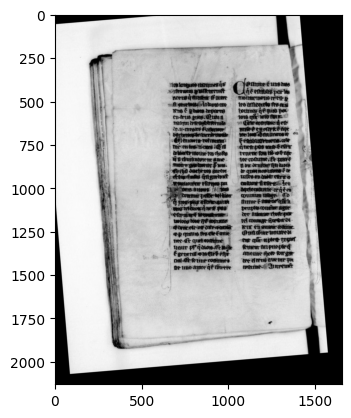

In [130]:
rotimg = rectify(image[:,:1490], rad=np.pi/2- np.median(all_angles))
plt.imshow(rotimg)

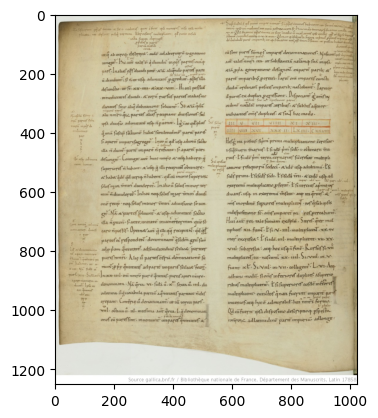

In [181]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Lebec/Boethius_De_institutione_arithmetica-f7v.jpeg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas, masks = get_connected_components_dbscan(bw, eps_y=2, colored=image)

In [ ]:
fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(20,10))
ax0.imshow(image)
ax1.imshow(image)
angles = []
for i in range(len(areas)):
    print(i, areas[i], end='')
    x,y,x_,y_ = areas[i]
    rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False)
    ax0.add_patch(rect)
    # rect = patches.Rectangle((x,y),x_-x,y_-y)
    # find line
    line = cv2.HoughLines(np.uint8(masks[i]), 1, np.pi/180,int(masks[i].shape[1]/2.5))
    # print(len(line))
    if line is not None:
        line = line.squeeze(axis=1)
        # rho = line[0,0] # np.mean(line[:,0])
        # theta = line[0,1] # np.mean(line[:,1])
        # rho = np.mean(line[:,0])
        theta = np.mean(line[:,1])
        angles.append(theta)
        # a = np.cos(-theta-np.pi/2)
        # b = np.sin(-theta-np.pi/2)
        
        # y0 = y # int((rho-x0*np.cos(theta))/np.sin(theta))
        # x0 = int((rho-y0*np.sin(theta))/np.cos(theta)) # x
        # # x0 = max(x0,x)
        # # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))

        # y1 = y_ # int((rho-x1*np.cos(theta))/np.sin(theta))
        # x1 = int((rho-y1*np.sin(theta))/np.cos(theta)) # x_
        # # x1 = min(x1,x_)
        # # y1 = int((rho-x1*np.cos(theta))/np.sin(theta))

        # x0 = int((x_-x)/2)
        # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
        # ax1.axline((x0,y0),slope=-b/a,color='turquoise')
        # rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False)
        # ax1.add_patch(rect)
        # rad = -theta-np.pi/2
        rad = theta
        rad = rad - np.pi if rad < np.pi/2 else rad
        # rad = theta
        rect = patches.Rectangle((x,y),x_-x,y_-y, angle=rad,color='teal',fill=False)
        ax1.add_patch(rect)
        
        
        # print(x,x0,y,y0,x_,x1,y_,y1)
        # ax1.plot([x0,x1],[y0,y1],color='turquoise',linewidth=3)

        print('Yeah')
    else:
        print('None')
rotimg = rectify(image, rad=np.pi/2 - np.median(angles))
ax2.imshow(rotimg)
plt.show()

In [ ]:
new_gray = cv2.cvtColor(rotimg, cv2.COLOR_RGB2GRAY)
bw = black_white(cv2.GaussianBlur(new_gray,(5,5),0), threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas, masks = get_connected_components_dbscan(bw, eps_y=2, colored=rotimg)

In [ ]:
text, non_text = filter_text(image, areas, masks=masks)

In [ ]:
for i in range(20,30):
    # i+=30
    print(i)
    is_text_line(1-masks[i], eps=0.2)
    x,y,x_,y_ = areas[i]
    fig, (ax0,ax1 )= plt.subplots(2,1,figsize=(7,3))
    r = gray[y:y_,x:x_]
    ax1.imshow(r,cmap='gray')
    # ax1.autoscale(False)
    ax0.imshow(masks[i],cmap='gray')
    # find line
    line = cv2.HoughLines(np.uint8(masks[i]), 1, np.pi/180,int((x_-x)/2.5))
    print(len(line))
    if line is not None:
        line = line.squeeze(axis=1)
        for rho, theta in line[:10]:
            print(rho, theta)
            a = np.cos(-theta-np.pi/2)
            b = np.sin(-theta-np.pi/2)
            x0 = int((x_-x)/2)
            y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
            # print(x0,y0)
            x0 = np.cos(theta)*rho
            y0 = np.sin(theta)*rho
            ax0.axline((x0,y0),slope=-b/a,color='tomato',linestyle='dashed')
            ax1.axline((x0,y0),slope=-b/a,color='tomato',linestyle='dashed')
    # fig, ((ax0, ax1, ax2), (ax0_, ax1_, ax2_)) = plt.subplots(2,3,figsize=(17,14))
    # r = gray[y:y_,x:x_]
    # ax0.imshow(r,cmap='gray')
    # horizontal_mean = np.mean(r,axis=1)
    # vertical_mean = np.mean(r,axis=0)
    # general_mean = np.mean(r)
    # ax1.plot(horizontal_mean)
    # ax1.axhline(general_mean,color='tomato')
    # ax2.plot(vertical_mean)
    # ax2.axhline(general_mean,color='tomato')
    
    # r = 1-masks[i]
    # ax0_.imshow(r,cmap='gray')    
    # horizontal_mean = np.mean(r,axis=1)
    # vertical_mean = np.mean(r,axis=0)
    # general_mean = np.mean(r)
    # ax1_.plot(horizontal_mean)
    # ax1_.axhline(general_mean,color='tomato')
    # ax2_.plot(vertical_mean)
    # ax2_.axhline(general_mean,color='tomato')

    # plt.show()
    # fig, (ax1, ax3) = plt.subplots(2,1,figsize=(15,8), height_ratios=(4,4), layout='constrained')
    # ax1.imshow(r,cmap='gray')#, aspect='auto')
    # # ax1.autoscale(False)
    
    # ax3.plot(vertical_mean)#, aspect='auto')
    # # asp = np.diff(ax1.get_xlim())[0] / np.diff(ax1.get_ylim())[0]
    # # ax3.set_aspect(asp)
    # ax3.axhline(general_mean,color='tomato')
    # ax3.margins(x=0)
    # # ax3.autoscale(False)
    # cpt = 0
    # for i in range(len(vertical_mean)-1):
    #     if (general_mean - vertical_mean[i])*(general_mean - vertical_mean[i+1]) < 0:
    #         ax3.axvline(i,color='tomato',linestyle='dashed')
    #         ax1.axvline(i,color='tomato')
    #         cpt+=1
    # print(cpt, 'over', len(vertical_mean), '-->', cpt/len(vertical_mean))
    plt.show() 

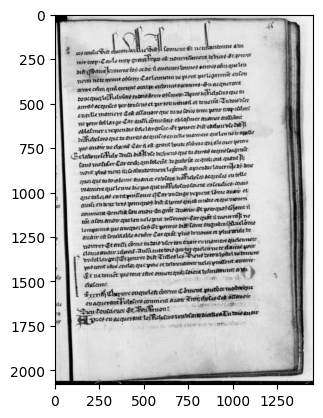

In [83]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Julien/Corpus B/Fr_1555_46r.jpg")
image = cv2.cvtColor(image[:,1390:], cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas, masks = get_connected_components_dbscan(bw, eps_x=15, eps_y=3, colored=image)

In [ ]:
for i in range(20,30):
    # i+=30
    print(i)
    is_text_line(1-masks[i], eps=0.2)
    x,y,x_,y_ = areas[i]
    fig, (ax0,ax1 )= plt.subplots(2,1,figsize=(7,3))
    r = gray[y:y_,x:x_]
    ax1.imshow(r,cmap='gray')
    # ax1.autoscale(False)
    ax0.imshow(masks[i],cmap='gray')
    # find line
    line = cv2.HoughLines(np.uint8(masks[i]), 1, np.pi/180,int((x_-x)/2.5))
    # print(len(line))
    if line is not None:
        line = line.squeeze(axis=1)
        for rho, theta in line[:10]:
            print(rho, theta)
            a = np.cos(-theta-np.pi/2)
            b = np.sin(-theta-np.pi/2)
            # x0 = int((x_-x)/2)
            # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
            # print(x0,y0)
            x0 = np.cos(theta)*rho
            y0 = np.sin(theta)*rho
            ax1.axline((x0,y0),slope=-b/a,color='tomato',linestyle='dashed')
    # fig, ((ax0, ax1, ax2), (ax0_, ax1_, ax2_)) = plt.subplots(2,3,figsize=(17,14))
    # r = gray[y:y_,x:x_]
    # ax0.imshow(r,cmap='gray')
    # horizontal_mean = np.mean(r,axis=1)
    # vertical_mean = np.mean(r,axis=0)
    # general_mean = np.mean(r)
    # ax1.plot(horizontal_mean)
    # ax1.axhline(general_mean,color='tomato')
    # ax2.plot(vertical_mean)
    # ax2.axhline(general_mean,color='tomato')
    
    # r = 1-masks[i]
    # ax0_.imshow(r,cmap='gray')    
    # horizontal_mean = np.mean(r,axis=1)
    # vertical_mean = np.mean(r,axis=0)
    # general_mean = np.mean(r)
    # ax1_.plot(horizontal_mean)
    # ax1_.axhline(general_mean,color='tomato')
    # ax2_.plot(vertical_mean)
    # ax2_.axhline(general_mean,color='tomato')

    # plt.show()
    # fig, (ax1, ax3) = plt.subplots(2,1,figsize=(15,8), height_ratios=(4,4), layout='constrained')
    # ax1.imshow(r,cmap='gray')#, aspect='auto')
    # # ax1.autoscale(False)
    
    # ax3.plot(vertical_mean)#, aspect='auto')
    # # asp = np.diff(ax1.get_xlim())[0] / np.diff(ax1.get_ylim())[0]
    # # ax3.set_aspect(asp)
    # ax3.axhline(general_mean,color='tomato')
    # ax3.margins(x=0)
    # # ax3.autoscale(False)
    # cpt = 0
    # for i in range(len(vertical_mean)-1):
    #     if (general_mean - vertical_mean[i])*(general_mean - vertical_mean[i+1]) < 0:
    #         ax3.axvline(i,color='tomato',linestyle='dashed')
    #         ax1.axvline(i,color='tomato')
    #         cpt+=1
    # print(cpt, 'over', len(vertical_mean), '-->', cpt/len(vertical_mean))
    plt.show() 

In [ ]:
fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(20,10))
ax0.imshow(image)
ax1.imshow(image)
angles = []
for i in range(len(areas)):
    print(i, areas[i], end='')
    x,y,x_,y_ = areas[i]
    rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False)
    ax0.add_patch(rect)
    # rect = patches.Rectangle((x,y),x_-x,y_-y)
    # find line
    line = cv2.HoughLines(np.uint8(masks[i]), 1, np.pi/180,int(masks[i].shape[1]/2.5))
    # print(len(line))
    if line is not None:
        line = line.squeeze(axis=1)
        # rho = line[0,0] # np.mean(line[:,0])
        # theta = line[0,1] # np.mean(line[:,1])
        # rho = np.mean(line[:,0])
        theta = np.mean(line[:,1])
        angles.append(theta)
        # a = np.cos(-theta-np.pi/2)
        # b = np.sin(-theta-np.pi/2)
        
        # y0 = y # int((rho-x0*np.cos(theta))/np.sin(theta))
        # x0 = int((rho-y0*np.sin(theta))/np.cos(theta)) # x
        # # x0 = max(x0,x)
        # # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))

        # y1 = y_ # int((rho-x1*np.cos(theta))/np.sin(theta))
        # x1 = int((rho-y1*np.sin(theta))/np.cos(theta)) # x_
        # # x1 = min(x1,x_)
        # # y1 = int((rho-x1*np.cos(theta))/np.sin(theta))

        # x0 = int((x_-x)/2)
        # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
        # ax1.axline((x0,y0),slope=-b/a,color='turquoise')
        # rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False)
        # ax1.add_patch(rect)
        # rad = -theta-np.pi/2
        rad = theta
        rad = -rad if rad < np.pi/2 else rad
        # rad = theta
        rect = patches.Rectangle((x,y),x_-x,y_-y, angle=rad,color='teal',fill=False)
        ax1.add_patch(rect)
        
        
        # print(x,x0,y,y0,x_,x1,y_,y1)
        # ax1.plot([x0,x1],[y0,y1],color='turquoise',linewidth=3)

        print('Yeah')
    else:
        print('None')
rotimg = rectify(image, rad=np.pi/2 - np.median(angles))
ax2.imshow(rotimg)
plt.show()

In [7]:
print(angles)

[1.7751023, 1.6150113, 1.7631078, 1.7745694, 1.8140627, 1.626127, 1.7507457, 1.5254177, 1.7186646, 1.7054362, 1.7094681, 1.7870655, 1.5254177, 1.6260253, 1.5289084, 1.7672385, 1.5254177, 1.527163, 1.5219271, 1.527163, 1.5289084, 1.527163, 1.5358896, 1.5254177, 1.5289084, 1.5289084, 1.5315263, 1.5254177, 1.527163, 1.527163, 1.5358896, 1.527163, 1.5289084, 1.5323989, 1.5358896, 1.5254177, 1.527163, 1.527163, 1.527163, 1.5254177, 1.5891931, 1.5315263, 1.7088782, 1.774165, 1.6960435, 1.558349, 1.8515503, 1.144936, 1.7613075]


In [ ]:
rotimg = rectify(image[:,:1490], rad=np.pi/2 - np.median(angles))
plt.imshow(rotimg)

In [ ]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Julien/Corpus B/reframed/Fr_578_109r_10.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas, masks = get_connected_components_dbscan(bw, eps_y=2, colored=image)

In [ ]:
fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(20,10))
ax0.imshow(image)
ax1.imshow(image)
angles = []
for i in range(len(areas)):
    print(i, areas[i], end='')
    x,y,x_,y_ = areas[i]
    rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False)
    ax0.add_patch(rect)
    # rect = patches.Rectangle((x,y),x_-x,y_-y)
    # find line
    line = cv2.HoughLines(np.uint8(masks[i]), 1, np.pi/180,int(masks[i].shape[1]/2.5))
    # print(len(line))
    if line is not None:
        line = line.squeeze(axis=1)
        # rho = line[0,0] # np.mean(line[:,0])
        # theta = line[0,1] # np.mean(line[:,1])
        # rho = np.mean(line[:,0])
        theta = np.mean(line[:,1])
        angles.append(theta)
        # a = np.cos(-theta-np.pi/2)
        # b = np.sin(-theta-np.pi/2)
        
        # y0 = y # int((rho-x0*np.cos(theta))/np.sin(theta))
        # x0 = int((rho-y0*np.sin(theta))/np.cos(theta)) # x
        # # x0 = max(x0,x)
        # # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))

        # y1 = y_ # int((rho-x1*np.cos(theta))/np.sin(theta))
        # x1 = int((rho-y1*np.sin(theta))/np.cos(theta)) # x_
        # # x1 = min(x1,x_)
        # # y1 = int((rho-x1*np.cos(theta))/np.sin(theta))

        # x0 = int((x_-x)/2)
        # y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
        # ax1.axline((x0,y0),slope=-b/a,color='turquoise')
        # rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False)
        # ax1.add_patch(rect)
        # rad = -theta-np.pi/2
        rad = theta
        rad = -rad if rad < np.pi/2 else rad
        # rad = theta
        rect = patches.Rectangle((x,y),x_-x,y_-y, angle=rad,color='teal',fill=False)
        ax1.add_patch(rect)
        
        
        # print(x,x0,y,y0,x_,x1,y_,y1)
        # ax1.plot([x0,x1],[y0,y1],color='turquoise',linewidth=3)

        print('Yeah')
    else:
        print('None')
rotimg = rectify(image, rad=np.pi/2 - np.median(angles))
ax2.imshow(rotimg)
plt.show()

In [ ]:
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas, masks = get_connected_components_dbscan(bw, eps_x=7, eps_y=7, colored=image)

In [12]:
print(type(masks))

<class 'list'>


In [23]:
print(np.argsort([np.sum(m) for m in masks])[-10:])

[476 856 321 597  27 323   7   2   0  35]


In [ ]:
i = 0
plt.imshow(masks[i],cmap='gray')
plt.show()
vmean = np.mean(masks[i], axis=0)
hmean = np.mean(masks[i], axis=1)
gmean = np.mean(masks[i])
plt.plot(vmean)
plt.axhline(gmean)
print(np.sum([1 if vmean[j] < gmean and vmean[j+1] > gmean else 0 for j in range(len(vmean[:-1]))]))
plt.show()
plt.plot(hmean)
plt.show()

In [ ]:
text, non_text = filter_text(image, areas)#, masks)

In [ ]:
for i in text:
    # i+=30
    print(i)
    is_text_line(1-masks[i], eps=0.2)
    x,y,x_,y_ = areas[i]
    fig, ((ax0, ax1, ax2), (ax0_, ax1_, ax2_)) = plt.subplots(2,3,figsize=(17,14))

    # ax1.imshow(r,cmap='gray')
    # find line
    # line = cv2.HoughLines(np.uint8(bw[y:y_,x:x_]), 1, np.pi/180,int((x_-x)/2.5))
    # print(len(line))
    # if line is not None:
    #     line = line.squeeze(axis=1)
    #     for rho, theta in line[:10]:
    #         # print(rho, theta)
    #         a = np.cos(-theta-np.pi/2)
    #         b = np.sin(-theta-np.pi/2)
    #         x0 = int((x_-x)/2)
    #         y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
    #         # print(x0,y0)
    #         ax1.axline((x0,y0),slope=-b/a,color='tomato',linestyle='dashed')
    r = gray[y:y_,x:x_]
    ax0.imshow(r,cmap='gray')
    horizontal_mean = np.mean(r,axis=1)
    vertical_mean = np.mean(r,axis=0)
    general_mean = np.mean(r)
    ax1.plot(horizontal_mean)
    ax1.axhline(general_mean,color='tomato')
    ax2.plot(vertical_mean)
    ax2.axhline(general_mean,color='tomato')
    
    r = 1-masks[i]
    ax0_.imshow(r,cmap='gray')    
    horizontal_mean = np.mean(r,axis=1)
    vertical_mean = np.mean(r,axis=0)
    general_mean = np.mean(r)
    ax1_.plot(horizontal_mean)
    ax1_.axhline(general_mean,color='tomato')
    ax2_.plot(vertical_mean)
    ax2_.axhline(general_mean,color='tomato')

    plt.show()
    fig, (ax1, ax3) = plt.subplots(2,1,figsize=(15,8), height_ratios=(4,4), layout='constrained')
    ax1.imshow(r,cmap='gray')#, aspect='auto')
    # ax1.autoscale(False)
    
    ax3.plot(vertical_mean)#, aspect='auto')
    # asp = np.diff(ax1.get_xlim())[0] / np.diff(ax1.get_ylim())[0]
    # ax3.set_aspect(asp)
    ax3.axhline(general_mean,color='tomato')
    ax3.margins(x=0)
    # ax3.autoscale(False)
    cpt = 0
    for i in range(len(vertical_mean)-1):
        if (general_mean - vertical_mean[i])*(general_mean - vertical_mean[i+1]) < 0:
            ax3.axvline(i,color='tomato',linestyle='dashed')
            ax1.axvline(i,color='tomato')
            cpt+=1
    print(cpt, 'over', len(vertical_mean), '-->', cpt/len(vertical_mean))
    plt.show() 

In [ ]:
for i in non_text:
    # i+=30
    print(i)
    is_text_line(1-masks[i], eps=0.2)
    x,y,x_,y_ = areas[i]
    fig, ((ax0, ax1, ax2), (ax0_, ax1_, ax2_)) = plt.subplots(2,3,figsize=(17,14))

    # ax1.imshow(r,cmap='gray')
    # find line
    # line = cv2.HoughLines(np.uint8(bw[y:y_,x:x_]), 1, np.pi/180,int((x_-x)/2.5))
    # print(len(line))
    # if line is not None:
    #     line = line.squeeze(axis=1)
    #     for rho, theta in line[:10]:
    #         # print(rho, theta)
    #         a = np.cos(-theta-np.pi/2)
    #         b = np.sin(-theta-np.pi/2)
    #         x0 = int((x_-x)/2)
    #         y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
    #         # print(x0,y0)
    #         ax1.axline((x0,y0),slope=-b/a,color='tomato',linestyle='dashed')
    r = gray[y:y_,x:x_]
    ax0.imshow(r,cmap='gray')
    horizontal_mean = np.mean(r,axis=1)
    vertical_mean = np.mean(r,axis=0)
    general_mean = np.mean(r)
    ax1.plot(horizontal_mean)
    ax1.axhline(general_mean,color='tomato')
    ax2.plot(vertical_mean)
    ax2.axhline(general_mean,color='tomato')
    
    r = 1-masks[i]
    ax0_.imshow(r,cmap='gray')    
    horizontal_mean = np.mean(r,axis=1)
    vertical_mean = np.mean(r,axis=0)
    general_mean = np.mean(r)
    ax1_.plot(horizontal_mean)
    ax1_.axhline(general_mean,color='tomato')
    ax2_.plot(vertical_mean)
    ax2_.axhline(general_mean,color='tomato')

    plt.show()
    fig, (ax1, ax3) = plt.subplots(2,1,figsize=(15,8), height_ratios=(4,4), layout='constrained')
    ax1.imshow(r,cmap='gray')#, aspect='auto')
    # ax1.autoscale(False)
    
    ax3.plot(vertical_mean)#, aspect='auto')
    # asp = np.diff(ax1.get_xlim())[0] / np.diff(ax1.get_ylim())[0]
    # ax3.set_aspect(asp)
    ax3.axhline(general_mean,color='tomato')
    ax3.margins(x=0)
    # ax3.autoscale(False)
    cpt = 0
    for i in range(len(vertical_mean)-1):
        if (general_mean - vertical_mean[i])*(general_mean - vertical_mean[i+1]) < 0:
            ax3.axvline(i,color='tomato',linestyle='dashed')
            ax1.axvline(i,color='tomato')
            cpt+=1
    print(cpt, 'over', len(vertical_mean), '-->', cpt/len(vertical_mean))
    plt.show() 

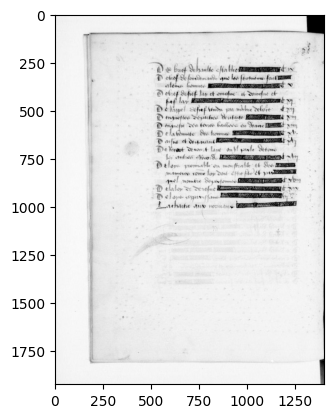

In [45]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Julien/reframed/Fr_5336_10v_11r_0.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
# imgs = reframe(image, trim_required=False, save_path="E://robocodico/ImagesCodicologie/Corpus de jeu/Julien/Fr_5336_10v_11r.jpg")
# plt.imshow(imgs[0])
# plt.show()

In [ ]:
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas = get_connected_components_dbscan(bw, eps_x=15, eps_y=2, colored=image)

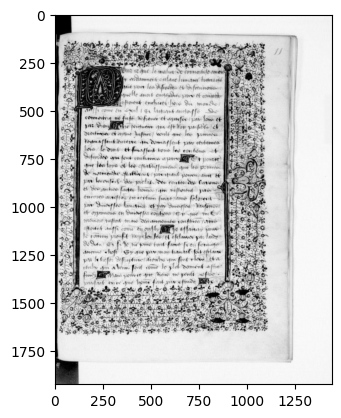

In [47]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Julien/reframed/Fr_5336_10v_11r_1.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas = get_connected_components_dbscan(bw, eps_x=15, eps_y=2, colored=image)

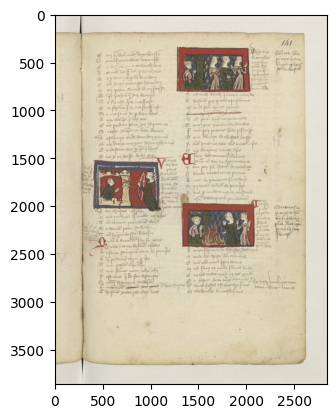

In [78]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Julien/Corpus B/Fr1563_141r.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

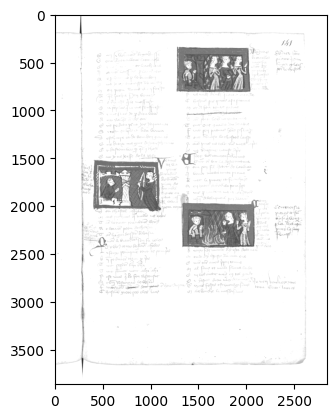

In [84]:
from skimage.filters import threshold_yen
from skimage.exposure import rescale_intensity
from skimage.io import imread, imsave

img = gray
yen_threshold = threshold_yen(img)
bright = rescale_intensity(img, (0, yen_threshold), (0, 255))

plt.imshow(bright,cmap='gray')
plt.show()

In [ ]:
alpha = 1.95 # Contrast control (1.0-3.0)
beta = 0 # Brightness control (0-100)

manual_result = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

plt.imshow('manual_result', manual_result)
plt.show()

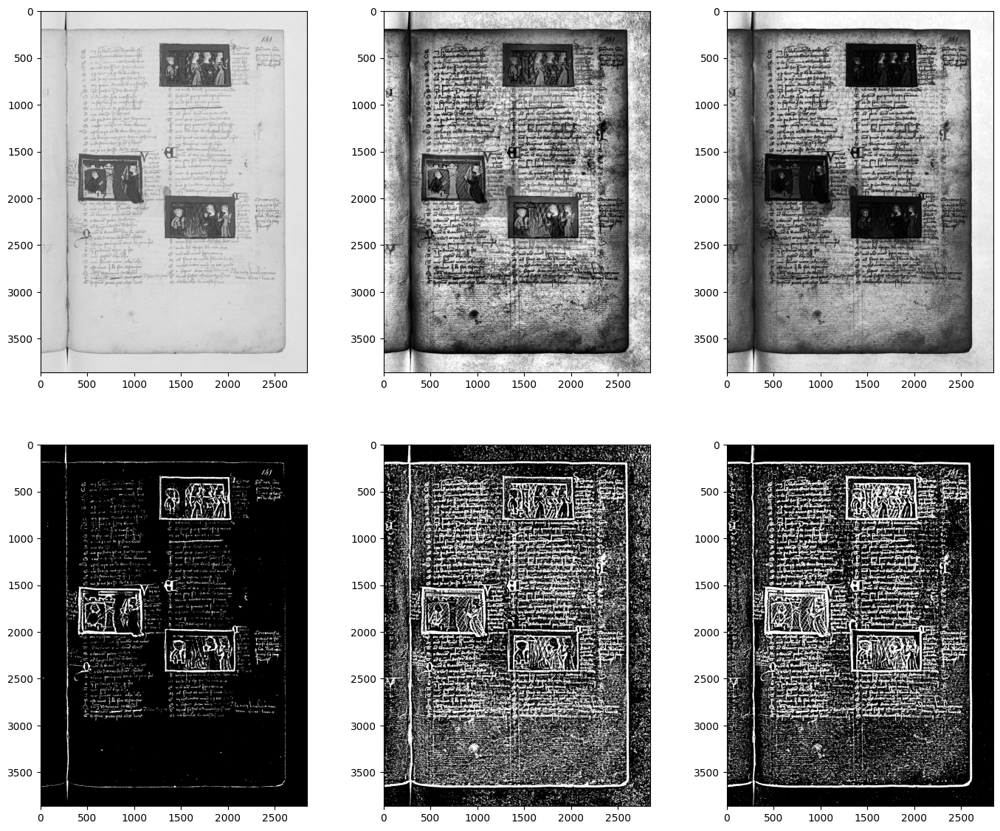

In [63]:
clahe = cv2.createCLAHE()#clipLimit=2.0, tileGridSize=(8,8))
cl1 = clahe.apply(gray)
cl2 = cv2.equalizeHist(gray)
w = 49
bw = black_white(gray, threshold='sauvola', window_size=w, k=0.2)
bw1 = black_white(cl1, threshold='sauvola', window_size=w, k=0.2)
bw2 = black_white(cl2, threshold='sauvola', window_size=w, k=0.2)
fig, ((ax1, ax2, ax3), (ax1_, ax2_, ax3_)) = plt.subplots(2,3,figsize=(17,14))
ax1.imshow(gray,cmap='gray')
ax2.imshow(cl1,cmap='gray')
ax3.imshow(cl2,cmap='gray')
ax1_.imshow(bw,cmap='gray')
ax2_.imshow(bw1,cmap='gray')
ax3_.imshow(bw2,cmap='gray')
plt.show()

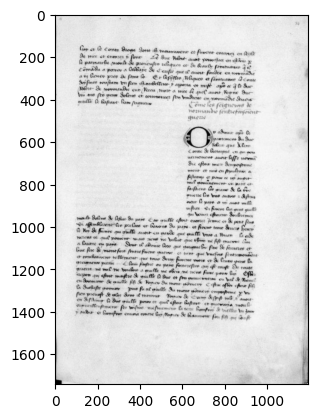

In [9]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Julien/Corpus B/reframed/Fr_10468_34r_01.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas = get_connected_components_dbscan(bw, eps_x=15, eps_y=2, colored=image)

In [ ]:
i = 25
for x,y,x_,y_ in areas[:10]:
    print(i)
    i+=1
    fig, (ax0, ax1, ax2, ax3) = plt.subplots(1,4,figsize=(17,7))
    r = gray[y:y_,x:x_]
    print(outer_module(r))
    ax0.imshow(image)
    rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False,linewidth=1)
    ax0.add_patch(rect)
    ax1.imshow(r,cmap='gray')
    # find line
    line = cv2.HoughLines(np.uint8(bw[y:y_,x:x_]), 1, np.pi/180,int((x_-x)/2.5))
    # print(len(line))
    if line is not None:
        line = line.squeeze(axis=1)
        for rho, theta in line[:10]:
            # print(rho, theta)
            a = np.cos(-theta-np.pi/2)
            b = np.sin(-theta-np.pi/2)
            x0 = int((x_-x)/2)
            y0 = int((rho-x0*np.cos(theta))/np.sin(theta))
            # print(x0,y0)
            ax1.axline((x0,y0),slope=-b/a,color='tomato',linestyle='dashed')
    ax2.plot(np.mean(r,axis=1))
    ax2.axhline(np.mean(r),color='tomato')
    ax3.plot(np.mean(r,axis=0))
    ax3.axhline(np.mean(r),color='tomato')
    plt.show()

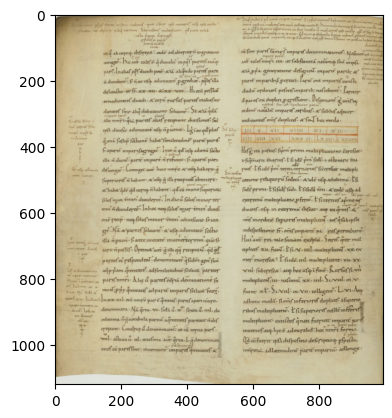

In [85]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Lebec/reframed/Boethius_De_institutione_arithmetica-f7v_0.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
areas = get_connected_components_dbscan(bw, eps_x=10, eps_y=10, colored=image)

In [ ]:
for x,y,x_,y_ in areas[:50]:
    fig, (ax0, ax1, ax2, ax3) = plt.subplots(1,4,figsize=(17,7))
    r = gray[y:y_,x:x_]
    ax0.imshow(image)
    rect = patches.Rectangle((x,y),x_-x,y_-y,color='tomato',fill=False,linewidth=1)
    ax0.add_patch(rect)
    ax1.imshow(r,cmap='gray')
    ax2.plot(np.mean(r,axis=1))
    ax2.axhline(np.mean(r),color='tomato')
    ax3.plot(np.mean(r,axis=0))
    ax3.axhline(np.mean(r),color='tomato')
    plt.show()

In [ ]:
res = cart_regression_bi_simul(image, mean_squared_error, max_depth=40, start=30)

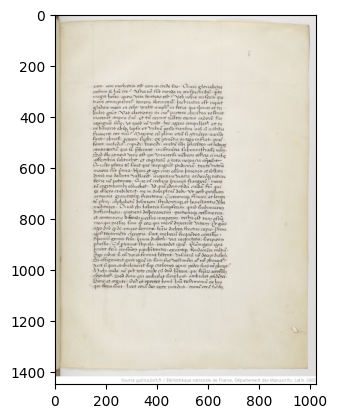

In [5]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Emilie Cottereau-Gabillet/BnF Lat 1865, f. 5r.jpeg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [11]:
print(res)

[(0, 0, 967, 256), (0, 256, 11, 1052), (11, 256, 126, 1052), (126, 256, 636, 1052), (0, 1052, 16, 1365), (16, 1052, 636, 1365), (636, 256, 867, 1365), (867, 256, 967, 1365)]


In [ ]:
textres = check_text([res],[image])

In [ ]:
text_areas = [(126, 256, 636, 1052, 37)]
no_text = delete_text_binary(image, text_areas, verbose=True)

In [ ]:
components = get_connected_components_dbscan(no_text,colored=image,eps_x=10, eps_y=10)
for x,y,x_,y_ in components:
    plt.imshow(no_text[y:y_,x:x_],cmap='gray')
    plt.show()

In [ ]:
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
get_connected_components_dbscan(bw,colored=image)

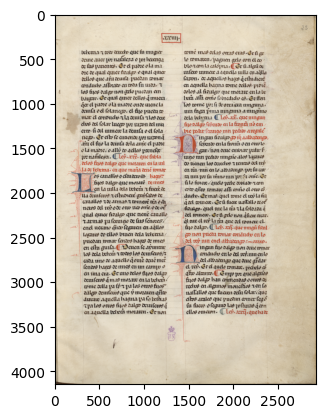

In [4]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Foronda/reframed/FF-BNE15-7, fol. 24v-25_1.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
get_connected_components_dbscan(bw,colored=image)

In [ ]:
bw = black_white(gray, threshold='sauvola', window_size=25, k=0.2)
plt.figure(figsize=(7,10))
plt.imshow(bw,cmap='gray')
plt.show()
get_connected_components_dbscan(bw, eps_x=10, eps_y=10, colored=image)

In [18]:
a = (9,0)
print(np.array(a))


[9 0]


In [ ]:
otsu_multiple_gaussians(gray,n=2)

In [ ]:
res = cart_regression_bi_simul(image,mean_squared_error,rate=1,start=1,max_depth=5,verbose=True)
print(res)
show_areas(image,res)

In [ ]:
# [(0, 0, 967, 254), (0, 254, 127, 1050), (127, 254, 637, 1050), (0, 1050, 637, 1365), (637, 254, 967, 1365)]

In [ ]:
res = [(0, 0, 967, 254), (0, 254, 127, 1050), (127, 254, 637, 1050), (0, 1050, 637, 1365), (637, 254, 967, 1365)]
check_text([res],[image])

In [ ]:
get_words(image, 127, 254, 637, 1050)

In [ ]:
no_text = delete_text_binary(image, [(127, 254, 637, 1050)], verbose=True)

In [91]:
test = gray < threshold_sauvola(gray,25,k=0.2)
print(len(get_white_pixels_coords(test)))

87152


In [ ]:
components = get_connected_components_dbscan(no_text,colored=image)
for x,y,x_,y_ in components:
    plt.imshow(no_text[y:y_,x:x_],cmap='gray')
    plt.show()

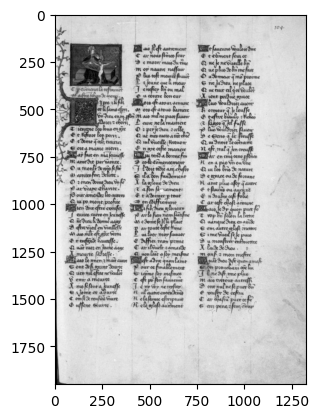

In [5]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Julien/Corpus B/reframed/Fr_578_109r_1.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [6]:
res = [(0, 0, 1038, 157), (0, 157, 78, 585), (78, 157, 352, 379), \
      (78, 379, 219, 442), (78, 442, 219, 585), (219, 379, 352, 585), \
      (352, 157, 414, 585), (414, 157, 691, 585), (691, 157, 769, 585), \
      (769, 157, 1038, 585), (0, 585, 74, 833), (0, 833, 5, 1230), \
      (0, 1230, 5, 1549), (5, 833, 74, 1549), (74, 585, 330, 1549), \
      (330, 585, 352, 1549), (352, 585, 415, 1549), (415, 585, 668, 1549), \
      (668, 585, 688, 1549), (688, 585, 761, 1549), (761, 585, 1038, 1549), \
      (1038, 0, 1320, 1549), (1320, 0, 1327, 1549), (0, 1549, 11, 1951), \
      (11, 1549, 1115, 1951), (1115, 1549, 1327, 1951)]

In [ ]:
check_text([res],[image])

In [ ]:
# a = black_white(255-black_white(gray[:,1438:]))
# edges = cv2.Canny(gray[:,1438:],30,150,apertureSize = 3) 
# # a = gray<threshold_niblack(gray,49,k=-0.2)
# lines = cv2.HoughLines(edges,1,np.pi/180,int(len(edges)/7))
# lines = np.squeeze(lines, axis=1)
# plt.figure(figsize=(30,20))
# plt.imshow(edges,cmap='gray')
# nbmax = 200
# a = np.cos(lines[:,1])
# b = np.sin(lines[:,1])
# x0 = (a*lines[:,0]).astype(int)
# y0 = (b*lines[:,0]).astype(int)
# print(x0)
# for i in range(nbmax):
#     x,y = get_points(len(edges),len(edges[0]),a[i],b[i],x0[i],y0[i])
#     if len(y) == 0 or min(y) > 0 or max(y) < len(edges)-1:
#         continue
#     plt.plot(x,y,color='tomato')
# # plt.show()
# # plt.imsave('../a.png',edges,cmap='gray')
# plt.yticks([])
# plt.xticks([])
# plt.savefig('../a.jpg', bbox_inches='tight')

In [ ]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Julien/Corpus B/reframed/Fr_578_109r_1.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
res = cart_regression_bi_simul(image,mean_squared_error,rate=1,start=25,max_depth=40,verbose=True)
print(res)
show_areas(image,res)

In [ ]:
restext = check_text([res],[image])

In [64]:
text_areas = [(78, 379, 219, 442, 1), (219, 379, 352, 585, 5), (74, 585, 330, 1549, 27), \
        (415, 585, 668, 1549, 27), (761, 585, 1038, 1549, 27), (414, 157, 691, 585, 11),\
        (769, 157, 1038, 585, 11)]

In [ ]:
no_text = delete_text_binary(image, text_areas, verbose=True)

In [71]:
print(len(get_white_pixels_coords(no_text)))

68541


In [ ]:
components = get_connected_components_dbscan(no_text,colored=image)
for x,y,x_,y_ in components:
    plt.imshow(no_text[y:y_,x:x_],cmap='gray')
    plt.show()

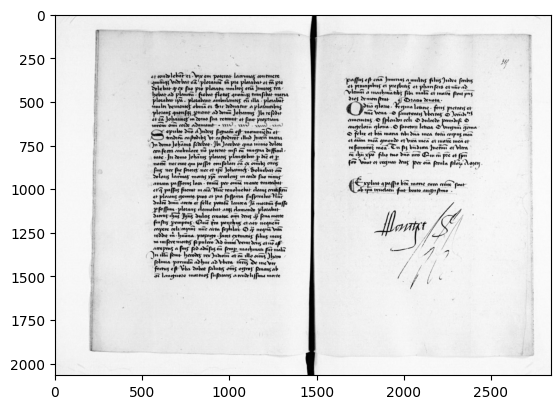

In [25]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Julien/Corpus B/Fr_5036_214v.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
binary = gray < threshold_niblack(gray,81,k=-0.2)
# binary = black_white(gray)
plt.figure(figsize=(10,15))
plt.imshow(binary,cmap='gray')
plt.show()

In [ ]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Emilie Cottereau-Gabillet/reframed/BnF Fr 24287, f. 130v_0.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
plt.imshow(image[195:235,300:385])
plt.show()
frame = image[195:235,300:385]

In [ ]:
h,w,_ = frame.shape
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
            'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

for meth in methods[:]:
    img = image.copy()
    method = eval(meth)
    res = cv2.matchTemplate(img,frame,method)
    print(res.shape)
    ind = np.unravel_index(np.argsort(res, axis=None), res.shape)
    n = 25
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        n = -n
    # print(ind[0][min(-n,0):min(-n,0)+abs(n)])
    for y,x in zip(ind[0][min(-n,0):min(-n,0)+abs(n)-1],ind[1][min(-n,0):min(-n,0)+abs(n)-1]):
        # print(x,y,'-->',res[y,x])
        top_left = (x,y)
        bottom_right = (top_left[0] + w, top_left[1] + h)
        cv2.rectangle(img, top_left, bottom_right, 255, 2)

    fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,15))
    ax1.imshow(res,cmap = 'gray')
    # ax1.imshow(black_white(res, 6000000),cmap='gray')
    ax2.imshow(img,cmap = 'gray')
    # plt.subplot(121),plt.imshow(res,cmap = 'gray')
    # plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    # plt.subplot(122),plt.imshow(img,cmap = 'gray')
    # plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    # plt.suptitle(meth)
    plt.suptitle(meth)
    plt.show()

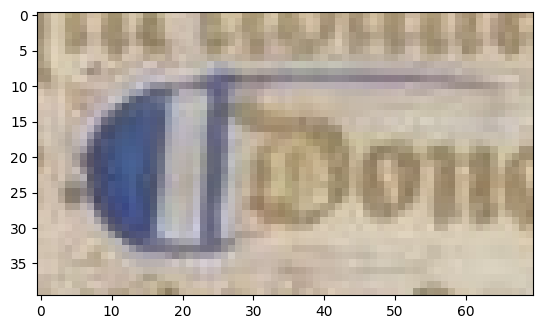

In [46]:
frame = image[190:230,730:800]
# print(frame.shape)
# print(frame[:,:,0])
# print(frame[:,:,1])
# print(frame[:,:,2])

hsv = cv2.cvtColor(frame, cv2.COLOR_RGB2HSV)
    
# Threshold of blue in HSV space
lower_blue = np.array([60, 35, 140])
upper_blue = np.array([180, 255, 255])

# preparing the mask to overlay
mask = cv2.inRange(hsv, lower_blue, upper_blue)
    
# The black region in the mask has the value of 0,
# so when multiplied with original image removes all non-blue regions
result = cv2.bitwise_and(frame, frame, mask = mask)

plt.imshow(frame)
plt.show()
# plt.imshow(mask)
# plt.show()
# plt.imshow(result)
# plt.show()

In [ ]:
h,w,_ = frame.shape
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
            'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

for meth in methods[:]:
    img = image.copy()
    method = eval(meth)
    res = cv2.matchTemplate(img,frame,method)
    print(res.shape)
    ind = np.unravel_index(np.argsort(res, axis=None), res.shape)
    n = 25
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        n = -n
    # print(ind[0][min(-n,0):min(-n,0)+abs(n)])
    for y,x in zip(ind[0][min(-n,0):min(-n,0)+abs(n)-1],ind[1][min(-n,0):min(-n,0)+abs(n)-1]):
        # print(x,y,'-->',res[y,x])
        top_left = (x,y)
        bottom_right = (top_left[0] + w, top_left[1] + h)
        cv2.rectangle(img, top_left, bottom_right, 255, 2)

    fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,15))
    ax1.imshow(res,cmap = 'gray')
    # ax1.imshow(black_white(res, 6000000),cmap='gray')
    ax2.imshow(img,cmap = 'gray')
    # plt.subplot(121),plt.imshow(res,cmap = 'gray')
    # plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    # plt.subplot(122),plt.imshow(img,cmap = 'gray')
    # plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    # plt.suptitle(meth)
    plt.suptitle(meth)
    plt.show()

In [ ]:
imgres = reframe(image,save_path="E://robocodico/ImagesCodicologie/Corpus de jeu/Emilie Cottereau-Gabillet/BnF Fr 24287, f. 130v.jpeg")

In [ ]:
res = cart_regression_bi_simul(image,mean_squared_error,rate=1,start=25,max_depth=40,verbose=True)
print(res)
show_areas(image,res)

In [ ]:
text_areas = check_text([res],[image])

In [ ]:
no_text = delete_text_binary(image,[(272, 185, 535, 535, 15), (272, 535, 535, 1059, 23), (272, 1059, 535, 1138, 3), (592, 185, 853, 776, 26), (592, 776, 853, 1138, 15)],verbose=True)

In [7]:
print(len(get_white_pixels_coords(no_text)))
get_connected_components_dbscan(no_text,colored=image)

3366


In [ ]:
image_path = "E://robocodico/ImagesCodicologie/Corpus de jeu/Emilie Cottereau-Gabillet/reframed/Arsenal 5059, f. 3v_0.png"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
imgres = reframe(image,save_path=image_path)

In [ ]:
res = cart_regression_bi_simul(image,mean_squared_error,rate=1,start=30,max_depth=40,verbose=True)
print(res)
show_areas(image,res)

In [ ]:
text_areas = check_text([res],[image])
no_text = delete_text_binary(image,text_areas[0],verbose=True)

In [41]:
print(len(get_white_pixels_coords(no_text)))
get_connected_components_dbscan(no_text,colored=image)

13125


In [ ]:
# gray = gray[:,:500]
w = np.array([[-1,-1,-1],[-1,9,-1],[-1,-1,-1]]) 
gray_ = gray  
# gray_ = convolve2d(gray,w)
_,(a,b,c,d) = plt.subplots(4,1,figsize=(30,40))
kernel = np.ones((3,3))
edges = cv2.Canny(gray_,30,150,apertureSize = 3)   
# binary = cv2.dilate(edges,kernel,iterations = 1)
# binary = gray_ < threshold_li(gray_)
# a.imshow(image,cmap='gray')
# c.imshow(image,cmap='gray')
# b.imshow(1-black_white(gray_,otsu=True),cmap='gray')
a.imshow(1-black_white(gray_),cmap='gray')
niblack = gray_ < threshold_niblack(gray_,81,k=-0.2)
d.imshow(niblack,cmap='gray')
# c.imshow(convolve2d(np.uint8(niblack),kernel),cmap='gray')
# c.imshow(gray_ < threshold_sauvola(gray_,25),cmap='gray')
c.imshow(cv2.blur(np.uint8(niblack),(7,7)),cmap='gray')
b.imshow(edges,cmap='gray')
# d.imshow(binary,cmap='gray')
plt.show()

In [ ]:
imgres = reframe(image,save_path="E://robocodico/ImagesCodicologie/Corpus de jeu/Foronda/FF-BNE15-7, fol. 2v-3.tif")
for img in imgres:
    plt.imshow(img)
    plt.show()

In [ ]:
# gray = gray[:,:500]
w = np.array([[-1,-1,-1],[-1,9,-1],[-1,-1,-1]]) 
gray_ = gray  
# gray_ = convolve2d(gray,w)
_,(a,b,c,d) = plt.subplots(4,1,figsize=(30,40))
kernel = np.ones((3,3))
edges = cv2.Canny(gray_,30,150,apertureSize = 3)   
# binary = cv2.dilate(edges,kernel,iterations = 1)
# binary = gray_ < threshold_li(gray_)
# a.imshow(image,cmap='gray')
# c.imshow(image,cmap='gray')
# b.imshow(1-black_white(gray_,otsu=True),cmap='gray')
a.imshow(1-black_white(gray_),cmap='gray')
niblack = gray_ < threshold_niblack(gray_,81,k=0.2)
d.imshow(niblack,cmap='gray')
# c.imshow(convolve2d(np.uint8(niblack),kernel),cmap='gray')
c.imshow(gray_ < threshold_sauvola(gray_,25),cmap='gray')
b.imshow(edges,cmap='gray')
# d.imshow(binary,cmap='gray')
plt.show()

In [ ]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Foronda/FF-RBMEYII7, fol. XIIIv-1.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
imgres = reframe(image,save_path="E://robocodico/ImagesCodicologie/Corpus de jeu/Foronda/FF-RBMEYII7, fol. XIIIv-1.jpg")
for img in imgres:
    plt.imshow(img)
    plt.show()

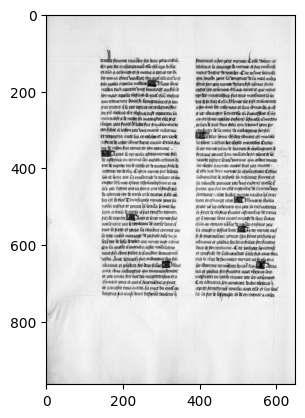

In [ ]:
image = cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Emilie Cottereau-Gabillet/reframed/BnF Fr 232, ff. 10v-11r_0.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
norm_image = gray/255.0
plt.imshow(image)
plt.show()

In [ ]:
left = cv2.cvtColor(cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Emilie Cottereau-Gabillet/reframed/BnF Fr 232, ff. 10v-11r_0.png"),cv2.COLOR_BGR2RGB)
rigth = cv2.cvtColor(cv2.imread("E://robocodico/ImagesCodicologie/Corpus de jeu/Emilie Cottereau-Gabillet/reframed/BnF Fr 232, ff. 10v-11r_1.png"),cv2.COLOR_BGR2RGB)

In [ ]:
res = cart_regression_bi_simul(left,mean_squared_error,rate=1,start=15,max_depth=30)
print(res)
show_areas(left,res)

In [ ]:
rsetext = check_text([res],[left])